# Setting

## Library

In [1]:
import pandas as pd
import numpy as np
import math

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import random
import os
from tqdm.notebook import tqdm

In [58]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [5]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score # 정확도
from sklearn.metrics import precision_score # 정밀도
from sklearn.metrics import recall_score # 재현율
from sklearn.metrics import f1_score # F1-Score
from sklearn.metrics import confusion_matrix

## Seed

In [6]:
def my_seed_everywhere(seed):
    random.seed(seed) # random
    np.random.seed(seed) # numpy
    os.environ["PYTHONHASHSEED"] = str(seed) # os
    print(f'고정된 Seed : {seed}')

In [7]:
my_seed_everywhere(42)

고정된 Seed : 42


# Data Set

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
path_file = '/content/drive/MyDrive/UNIST/AICP/data/dynmom_dat.csv'

DATA = pd.read_csv(path_file)

# Preprocessing

In [10]:
def preprocessing(data, used=None):
  # 'DATE'를 칼럼 대신 인덱스로 사용
  data.index = data['DATE']
  data = data.drop(columns='DATE')
  print("'DATE'를 칼럼 대신 인덱스로 사용")

  # 결측치 제거 및 모델 학습에 불필요한 칼럼 제거
  data = data.dropna()
  data = data.drop(columns=['winner', 'loser', 'form_date'])
  print("결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')")

  if used != None:
    D = ', '.join(used)
    used += ['wml']
    data = data[used]
    print(f"훈련에 사용되는 변수 들 : {D}")

  return data

In [11]:
case2 = ['mvol_t_1', 'mvol_t_2', 'mvol_t_3', 'mvol_t_4' , 'mvol_t_5', 'mvol_t_6', 'cum_winner', 'cum_loser']
case_name = 'CASE_2'
df = preprocessing(DATA, used=case2)

'DATE'를 칼럼 대신 인덱스로 사용
결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')
훈련에 사용되는 변수 들 : mvol_t_1, mvol_t_2, mvol_t_3, mvol_t_4, mvol_t_5, mvol_t_6, cum_winner, cum_loser


In [12]:
def normal_wml(df):
  print("'wml'이 양수면 1 & 음수면 0")
  print("Output : 'Preprocessed_Data' & 'WML'")
  print()

  cond_wml = (df['wml']>=0)
  df.loc[cond_wml, 'pos_wml'] = 1
  df.loc[~cond_wml, 'pos_wml'] = 0

  POS_WML = df['pos_wml'].value_counts()
  print(f'Ratio : {POS_WML[0]/POS_WML[1]}')
  print(POS_WML)

  return df

In [13]:
dynmom = normal_wml(df)

'wml'이 양수면 1 & 음수면 0
Output : 'Preprocessed_Data' & 'WML'

Ratio : 0.5634379263301501
1.0    733
0.0    413
Name: pos_wml, dtype: int64


# Modeling

In [14]:
def Roling_Windows(data, window_size, method, model):

  # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
  result_dict = {
      'TRAIN_START_DATE':[], # 훈련 데이터 시작 지점
      'TRAIN_END_DATE':[], # 훈련 데이터 마지막 지점
      'TEST_DATE':[], # 테스트 데이터 지점
      'wml':[], # wml 값
      'dynamic_momentum':[], # 다이나믹 모멘텀 값
      'Actual_POS_WML':[], # 실제 Target 값 (0 or 1)
      'dynamic_leverage':[], # 추론된 Target 확률값
      'static_leverage':[], # 추론된 Target 값 (0 or 1)
  }

  df_feature = pd.DataFrame()

  # 모델 학습이 종료되는 지점 설정
  end = data.shape[0] - window_size

  print('*'*50)
  print('설정된 Model의 하이퍼파리미터 : \n')
  for p, v in zip(model.get_params(deep=True).keys(), model.get_params(deep=True).values()):
    print(f'   {p} : {v}')
  print()
  print('*'*50)

  for i in tqdm(range(end)):

    # 모델 학습 중지
    if i == end:
      print('Prediction using machine learning has ended.')
      break
    
    # Rolling Fixed Window
    if method == 'Fixed':
      MODEL = model
      train = data.iloc[0+i:window_size+i]

    # Rolling Expanding Window
    elif method == 'Expanding':
      MODEL = model
      train = data.iloc[0:window_size+i]
    
    # 'method' 잘못입력한 경우
    else:
      print("Make sure to set the method to either 'Fixed' or 'Expanding'.")
      break
    
    # 테스트 데이터 설정
    test = data.iloc[[window_size+i]]

    # Features와 Target 구분
    X_train = train.drop(columns=['pos_wml', 'wml'])
    y_train = train['pos_wml']

    X_test = test.drop(columns=['pos_wml', 'wml'])
    y_test = test['pos_wml'] 

    wml_test = list(test['wml'])

    # 모델 학습 및 추론
    MODEL.fit(X_train, y_train)
    pred_test = MODEL.predict(X_test)
    prob_test = MODEL.predict_proba(X_test)

    # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
    result_dict['TRAIN_START_DATE'].append(train.index[0])
    result_dict['TRAIN_END_DATE'].append(train.index[-1])
    result_dict['TEST_DATE'].append(test.index[0])

    result_dict['wml'].append(wml_test[0])

    dynamic_momentum = prob_test[0][-1] * wml_test[0]
    result_dict['dynamic_momentum'].append(dynamic_momentum)

    result_dict['Actual_POS_WML'].append(list(y_test)[0])
    result_dict['static_leverage'].append(pred_test[0])
    result_dict['dynamic_leverage'].append(prob_test[0][-1])

    # 트리 기반 모델 (사이킷런)의 Feature Importance 정보 수집
    feature_importances = MODEL.feature_importances_
    df_ft_importance = pd.DataFrame(feature_importances, index = X_train.columns).T
    df_ft_importance.index = y_test.index
    df_feature = pd.concat([df_feature, df_ft_importance])

  result = pd.DataFrame(result_dict)
  result.index = df_feature.index

  result = pd.concat([result, df_feature], axis=1)
  result = result.set_index('TEST_DATE')
  
  # 학습 및 테스트 데이터 정보, 실제값과 예측값 정보, 변수 중요도 정보
  return result

In [15]:
def plot_result(data):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data['static_leverage']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data['static_leverage'])
  precision = precision_score(data['Actual_POS_WML'], data['static_leverage'])
  recall = recall_score(data['Actual_POS_WML'], data['static_leverage'])
  F1_score = f1_score(data['Actual_POS_WML'], data['static_leverage'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data['static_leverage'])
  sns.heatmap(confusion, annot=True, fmt='g')
  
  plt.show()

In [16]:
def plot_feature_importances(data):

  data = data.drop(columns=['TRAIN_START_DATE', 'TRAIN_END_DATE', 'Actual_POS_WML',
                           'static_leverage', 'dynamic_leverage', 'cum_return',
                           'dynamic_momentum', 'wml'])

  print('\nFeature Importance of the model\n')

  # 날짜 별 Feature Importance 변화 추이
  plt.figure(figsize=(15, 5))
  for col in data.columns:

    sns.lineplot(data=data,
                x=data.index,
                y=col,
                label=col,
                alpha=0.3)
    
    plt.title('Feature importances using MDI')
    plt.xlabel('DATE')
    plt.ylabel('Mean decrease in impurity')
    plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=5,
                      width=0.1)
  plt.show()

  # 각 변수 별 Feature Importance 통계값
  MEAN = display_feature_importance(data, method='mean')
  MAX = display_feature_importance(data, method='max')
  MIN = display_feature_importance(data, method='min')

  plt.figure(figsize=(15, 5))
  sns.barplot(data=MEAN,
              y=MEAN.index,
              x='mean_Feature_Importance')

  plt.show()
  print()

  FEATURE_IMPORTANCE = pd.concat([MEAN, MAX, MIN], axis=1)
  display(FEATURE_IMPORTANCE)

In [17]:
def display_feature_importance(data, method):
       
    feature_dict = {}
    for col in data.columns:
      if method=='mean':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].mean())

      if method=='max':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].max())
      
      if method=='min':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].min())
    
    feature_df = pd.DataFrame(feature_dict).T
    feature_df.columns = [method+'_'+'Feature_Importance']
    feature_df=feature_df.sort_values(by=method+'_'+'Feature_Importance', ascending=False)

    return feature_df

In [18]:
def slice_feature_importance(data, num):

  if type(num) != bool:
    division = int(data.shape[0]/num)
    
    for i in range(num):

      if i == num-1:
        sliced_data = data.iloc[i*division:]

      else:
        sliced_data = data.iloc[i*division:(i+1)*division]

      start = sliced_data.index[0]
      end = sliced_data.index[-1]

      print()
      print('*'*50)
      print(f'\nDATE : {start} ~ {end}\n')
      print('*'*50)
      print()
      
      plot_result(sliced_data)
      plot_feature_importances(sliced_data)
  
  else:
    start = input('Start Date (ex: 20200131): ')
    end = input('Start Date (ex: 20221230): ')
    print('*'*50)
    print(f'\nDate : {start} ~ {end}\n')
    print('*'*50)
    print()

    sliced_data = data.loc[start:end]
    plot_result(sliced_data)
    plot_feature_importances(sliced_data)

In [19]:
def cum_return_sharpe_ratio(data, dynamic=True):

  if dynamic == True:
    weight = 'dynamic_leverage'
  else:
    weight = 'static_leverage'

  # 머신러닝 적용되지 않은 경우 Sharpe Ratio
  w_S = (data['wml'].mean()/data['wml'].std()) * math.sqrt(12)
  print('ORG Sharpe Ratio : {}'.format(w_S))

  # 머신러닝 적용된 경우 Sharpe Ratio
  S = (data['dynamic_momentum'].mean()/data['dynamic_momentum'].std())*math.sqrt(12)
  print('ML Sharpe Ratio : {}\n'.format(S))
  
  # 머신러닝 적용된 경우 누적 수익률
  data['cum_return'] = (1 + data.dynamic_momentum).cumprod() - 1 

  print('\n최근 누적 수익률\n')
  latly_10 = data[['cum_return']].sort_index(ascending=False).head(5)
  for i, r in zip(latly_10.index, latly_10['cum_return']):
    i = str(i)
    print('  {}년-{}월 -> {:0.2f}'.format(i[:4], i[4:6], r))

  print('\n누적 수익률 가장 높았던 순간 Top 10\n')
  top_10 = data[['cum_return']].sort_values(by='cum_return', ascending=False).head(10)
  rank = 1
  for i, r in zip(top_10.index, top_10['cum_return']):
    i = str(i)
    print('  {}등 : {}년-{}월 -> {:0.2f}'.format(rank, i[:4], i[4:6], r))
    rank += 1
  print()

  # 머신러닝 적용되지 않은 경우 누적 수익률
  without_machine = pd.DataFrame(data['wml'])
  without_machine['wml'] = (1 + without_machine.wml).cumprod() - 1
  without_machine.columns = ['cum_return'] 

  # 머신러닝 여부에 따른 누적 수익률 비교
  plt.figure(figsize=(13, 6))
  sns.lineplot(data=data, x=data.index, y=data['cum_return'], label='With_ML')
  sns.lineplot(data=without_machine, x=without_machine.index, y=without_machine['cum_return'], label='Original')
  plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
  plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=5,
                  width=5)
  
  plt.show()

In [20]:
def statistic_information(data, col):
  statistic = data[[col]].describe().T
  statistic['var'] = data[col].var()
  statistic['1%'] = data[col].quantile(0.01)
  statistic['99%'] = data[col].quantile(0.99)

  statistic = statistic[['count', 'mean', 'var', 'std',
                         'min', '1%', '25%', '50%',
                         '75%',  '99%', 'max']]

  return statistic

def plot_predict_result(data):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data['static_leverage']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data['static_leverage'])
  precision = precision_score(data['Actual_POS_WML'], data['static_leverage'])
  recall = recall_score(data['Actual_POS_WML'], data['static_leverage'])
  F1_score = f1_score(data['Actual_POS_WML'], data['static_leverage'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data['static_leverage'])
  sns.heatmap(confusion, annot=True, fmt='g')
  plt.title(f'Confusion Matrix')
  
  plt.show()

  # ACTUAL = PRED = 1
  cond = (data['Actual_POS_WML'] == 1) & (data['static_leverage'] == 1)
  cond_data = data.loc[cond]
  print('\nACTUAL = PRED = 1\n')

  plt.title('WML in ACTUAL = PRED = 1')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'wml')
  display(info)

  print()
  
  plt.title('Dynamic Momentum in ACTUAL = PRED = 1')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='dynamic_momentum')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  info = statistic_information(cond_data, 'dynamic_momentum')
  display(info)


  print()
  print('-'*80)
  print()

  # ACTUAL = PRED = 0
  cond = (data['Actual_POS_WML'] == 0) & (data['static_leverage'] == 0)
  cond_data = data.loc[cond]
  print('\nACTUAL = PRED = 0\n')

  plt.title('WML in ACTUAL = PRED = 0')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'wml')
  display(info)

  print()
  
  plt.title('Dynamic Momentum in ACTUAL = PRED = 0')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='dynamic_momentum')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'dynamic_momentum')
  display(info)

  print()
  print('-'*80)
  print()

  # ACTUAL = 0 & PRED = 1
  cond = (data['Actual_POS_WML'] == 0) & (data['static_leverage'] == 1)
  cond_data = data.loc[cond]
  print('\nACTUAL = 0 & PRED = 1\n')

  plt.title('WML in ACTUAL = 0 & PRED = 1')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'wml')
  display(info)

  print()
  
  plt.title('Dynamic Momentum in ACTUAL = 0 & PRED = 1')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='dynamic_momentum')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'dynamic_momentum')
  display(info)

  print()
  print('-'*80)
  print()

  # ACTUAL = 1 & PRED = 0
  cond = (data['Actual_POS_WML'] == 1) & (data['static_leverage'] == 0)
  cond_data = data.loc[cond]
  print('\nACTUAL = 1 &  PRED = 0\n')

  plt.title('WML in ACTUAL = 1 & PRED = 0')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'wml')
  display(info)

  print()
  
  plt.title('Dynamic Momentum in ACTUAL = 1 & PRED = 0')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='dynamic_momentum')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'dynamic_momentum')
  display(info)

In [21]:
def plot_dynamic_momentum(data):

  print('\nTop 5 dyn_mom\n')
  display(data.sort_values(by='dynamic_momentum', ascending=False).head(5))

  print('\nBottom 5 dyn_mom\n')
  display(data.sort_values(by='dynamic_momentum', ascending=True).head(5))
  print()

  plt.figure(figsize=(13,8))
  plt.title('Histogram of Dynamic Momentum')
  sns.histplot(data=data, x='dynamic_momentum', kde=True)
  plt.show()
  print()

  plt.figure(figsize=(13,8))
  plt.title('Line Plot of Dynamic Momentum')
  sns.lineplot(data=data, x=data.index, y='dynamic_momentum', marker='o', markersize=5 ,linewidth=0.5)
  plt.xticks([data.index[i] for i in range(0, len(data.index), 36)],
             labels=[str(data.index[i])[:4] for i in range(0, len(data.index), 36)])
  plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=13,
                  width=5)
  plt.show()
  print()

  plt.figure(figsize=(13,8))
  plt.title('Dynamic Leverage vs. WML')
  sns.lineplot(data=data, x=data.index, y='dynamic_leverage', label='Dynamic Leverage', marker='o', markersize=5 ,linewidth=0.5)
  sns.lineplot(data=data, x=data.index, y='wml', label='WML', marker='o', markersize=5 ,linewidth=0.5)
  plt.xticks([data.index[i] for i in range(0, len(data.index), 36)],
             labels=[str(data.index[i])[:4] for i in range(0, len(data.index), 36)])
  plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=2,
                  width=5)
  plt.legend()
  plt.show()

In [22]:
def leverage_save(result, DATA):
  DATA.index.name = 'TEST_DATE'
  start_index = Fixed_RDF_Result.index[0]
  DATA = DATA.loc[start_index:]
  DATA = DATA.drop(columns=['DATE', 'wml'])
  result = result[['TRAIN_START_DATE', 'TRAIN_END_DATE','wml',
                   'dynamic_momentum', 'Actual_POS_WML',
                   'dynamic_leverage', 'static_leverage']]
  SAVE = pd.concat([result, DATA], axis=1)
  SAVE.index = SAVE.index.astype(str)
  plot_save = SAVE.copy()
  plot_save['dynamic_leverage_100'] = plot_save['dynamic_leverage'].apply(lambda x : x/100)
  plot_save['dynamic_leverage_10'] = plot_save['dynamic_leverage'].apply(lambda x : x*10)

  plt.figure(figsize=(14, 10))
  plt.title('dynamic_leverage(/100) VS volatility of Momentum')
  sns.lineplot(data=plot_save, x=SAVE.index, y='dynamic_leverage_100', label='dynamic_leverage', alpha=0.4)
  for mv in ['mvol_cum6', 'mvol_t_1', 'mvol_t_2',
             'mvol_t_3', 'mvol_t_4', 'mvol_t_5', 'mvol_t_6']:

             sns.lineplot(data=plot_save, x=SAVE.index, y=mv, label=mv, alpha=0.5)    
  plt.legend()
  plt.xticks([plot_save.index[i] for i in range(0, len(plot_save.index), 36)],
              labels=[str(plot_save.index[i])[:4] for i in range(0, len(plot_save.index), 36)])
  plt.tick_params(axis='x',
                direction='out',
                labelrotation=45,
                length=1,
                pad=10,
                labelsize=10,
                width=5)
  plt.ylabel('')
  plt.show()
  print()

  plt.figure(figsize=(14, 10))
  plt.title('dynamic_leverage(*10) VS winner')
  sns.lineplot(data=plot_save, x=SAVE.index, y='dynamic_leverage_10', label='dynamic_leverage', alpha=0.4)
  for mv in ['cum_winner', 'cum_winner_t_2_4',
             'cum_winner_t_5_8', 'cum_winner_t_9_12']:

             sns.lineplot(data=plot_save, x=SAVE.index, y=mv, label=mv, alpha=0.5)    
  plt.legend()
  plt.xticks([plot_save.index[i] for i in range(0, len(plot_save.index), 36)],
              labels=[str(plot_save.index[i])[:4] for i in range(0, len(plot_save.index), 36)])
  plt.tick_params(axis='x',
                direction='out',
                labelrotation=45,
                length=1,
                pad=10,
                labelsize=10,
                width=5)
  plt.ylabel('')
  plt.show()
  print()

  plt.figure(figsize=(14, 10))
  plt.title('dynamic_leverage VS loser')
  sns.lineplot(data=plot_save, x=SAVE.index, y='dynamic_leverage', label='dynamic_leverage', alpha=0.4)
  for mv in ['cum_loser', 'cum_loser_t_2_4',
             'cum_loser_t_5_8', 'cum_loser_t_9_12']:

             sns.lineplot(data=plot_save, x=SAVE.index, y=mv, label=mv, alpha=0.5)    
  plt.legend()
  plt.xticks([plot_save.index[i] for i in range(0, len(plot_save.index), 36)],
              labels=[str(plot_save.index[i])[:4] for i in range(0, len(plot_save.index), 36)])
  plt.tick_params(axis='x',
                direction='out',
                labelrotation=45,
                length=1,
                pad=10,
                labelsize=10,
                width=5)
  plt.ylabel('')
  plt.show()

  return SAVE

## Random Forest

In [23]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

In [24]:
Fixed_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=RDF) 

**************************************************
설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]

ORG Sharpe Ratio : 0.7293406994683723
ML Sharpe Ratio : 0.7986159287492364


최근 누적 수익률

  2022년-12월 -> 8850.61
  2022년-11월 -> 8433.48
  2022년-10월 -> 8318.27
  2022년-09월 -> 7664.04
  2022년-08월 -> 7327.18

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 11352.30
  2등 : 2008년-11월 -> 10783.96
  3등 : 2009년-01월 -> 10657.22
  4등 : 2008년-12월 -> 10572.09
  5등 : 2008년-10월 -> 9992.43
  6등 : 2008년-09월 -> 9621.84
  7등 : 2008년-06월 -> 9592.55
  8등 : 2002년-09월 -> 9457.54
  9등 : 2008년-07월 -> 9058.36
  10등 : 2008년-08월 -> 8996.89



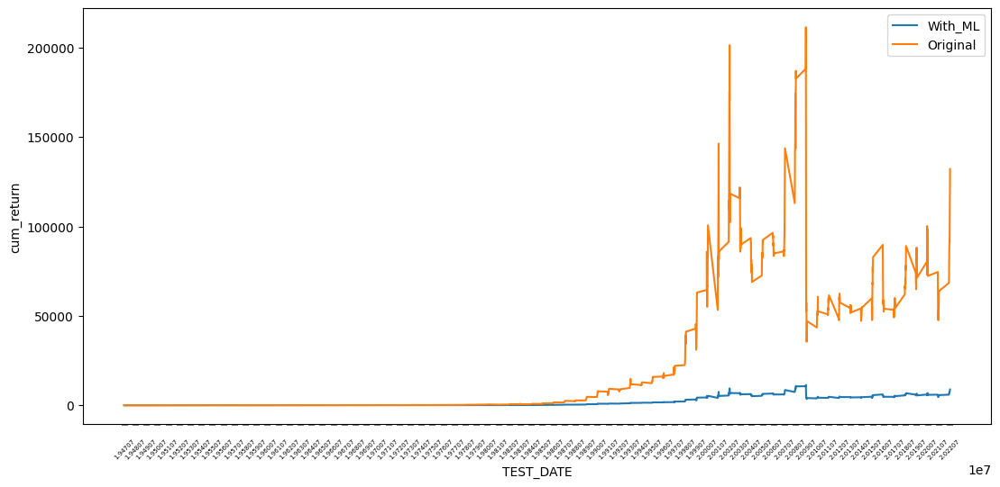

In [25]:
cum_return_sharpe_ratio(data=Fixed_RDF_Result,
                        dynamic=True)


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.28      0.34       316
         1.0       0.68      0.81      0.74       590

    accuracy                           0.62       906
   macro avg       0.56      0.54      0.54       906
weighted avg       0.59      0.62      0.60       906


accuracy : 0.6247240618101545

precision : 0.6770538243626062

recall : 0.8101694915254237

F1-Score : 0.7376543209876543



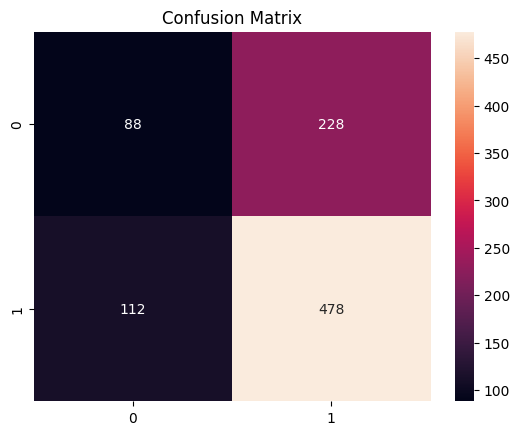


ACTUAL = PRED = 1



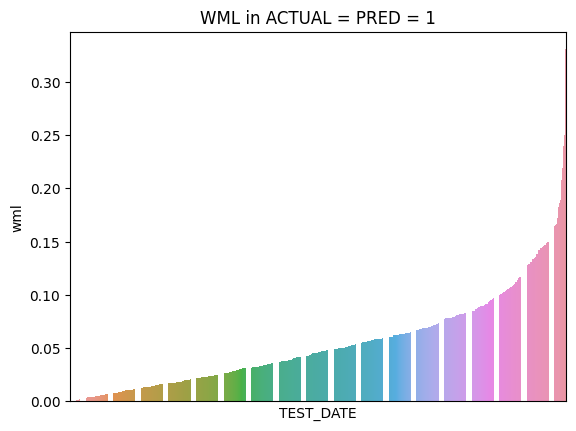

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,478.0,0.05463,0.001993,0.04464,0.000007,0.000645,0.021907,0.045848,0.074395,0.193397,0.330163


,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,478.0,0.038324,0.001012,0.031816,0.000005,0.000481,0.014816,0.031744,0.05271,0.150971,0.230161



--------------------------------------------------------------------------------


ACTUAL = PRED = 0



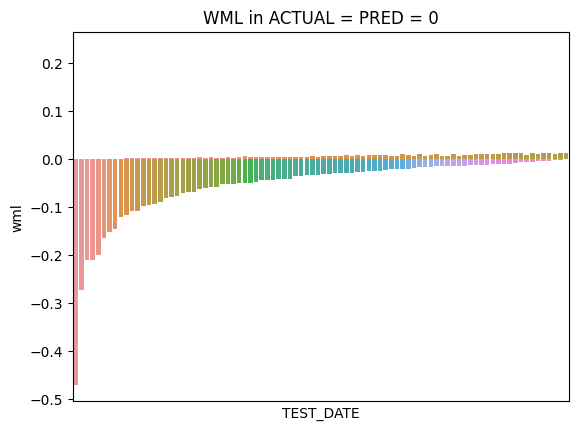

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,88.0,-0.054585,0.004773,0.069086,-0.469903,-0.297702,-0.06288,-0.031979,-0.01413,-0.002148,-0.000506


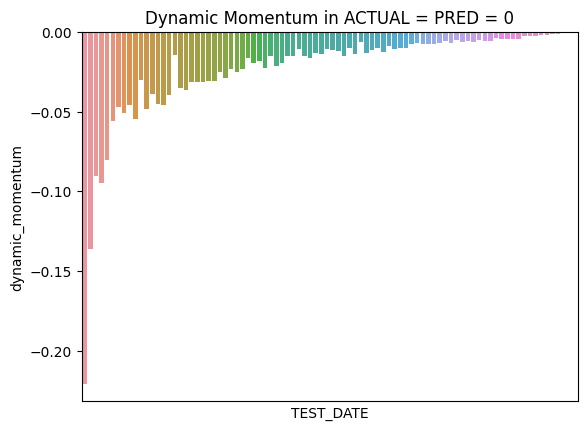

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,88.0,-0.023052,0.00098,0.031308,-0.220854,-0.147018,-0.0304,-0.013102,-0.006486,-0.000801,-0.000238



--------------------------------------------------------------------------------


ACTUAL = 0 & PRED = 1



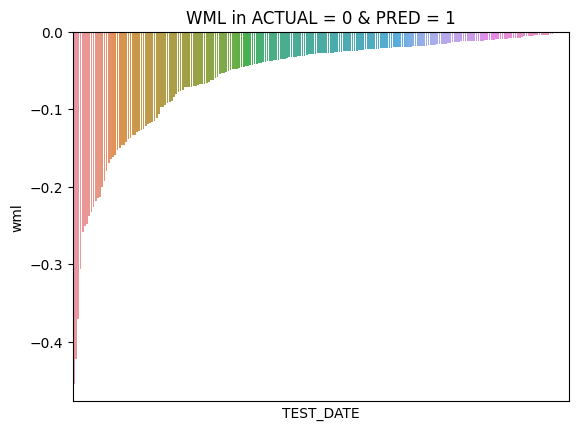

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,228.0,-0.056977,0.005211,0.072186,-0.454349,-0.352747,-0.069073,-0.027505,-0.015243,-0.000989,-0.000132


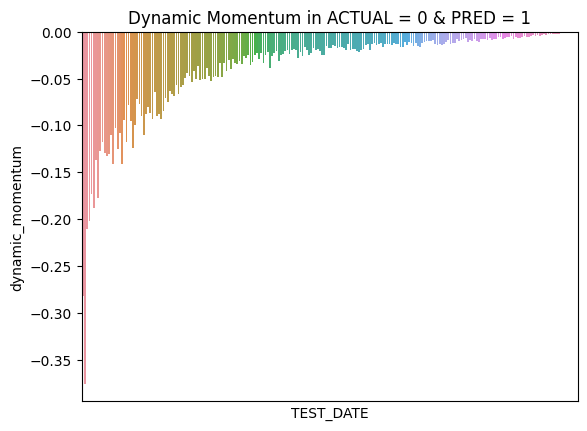

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,228.0,-0.037855,0.002433,0.049326,-0.375936,-0.208501,-0.047525,-0.018654,-0.010066,-0.000696,-0.00007



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



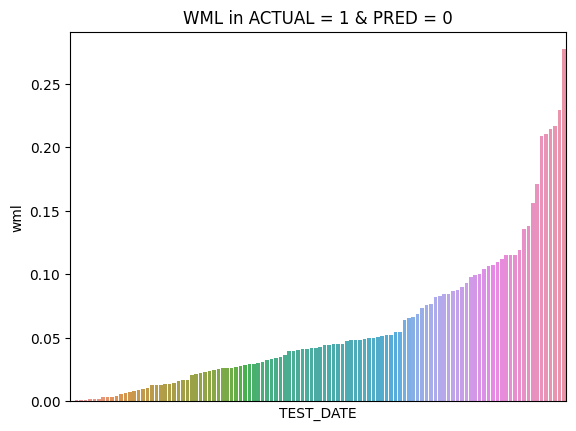

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,112.0,0.057894,0.003056,0.055277,0.000692,0.000845,0.02116,0.042305,0.083075,0.227783,0.276912


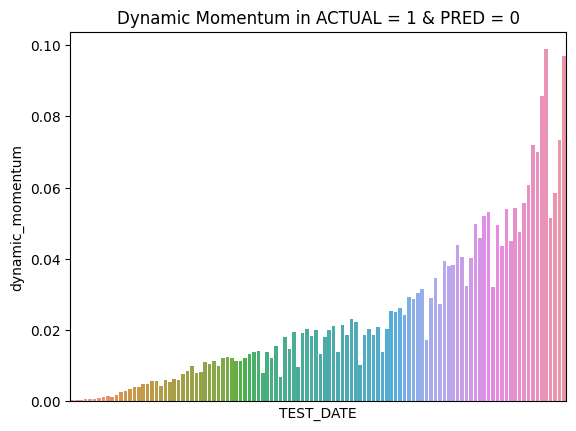

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,112.0,0.023379,0.000457,0.021373,0.000284,0.000341,0.008062,0.018137,0.032221,0.095685,0.098803


In [26]:
plot_predict_result(Fixed_RDF_Result)


Top 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_t_1,mvol_t_2,mvol_t_3,mvol_t_4,mvol_t_5,mvol_t_6,cum_winner,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,,,,
20020228,19820226,20020131,0.250175,0.230161,1.0,0.92,1.0,0.113746,0.120522,0.134953,0.127083,0.124330,0.132222,0.112718,0.134426,6737.748841
20000229,19800229,20000131,0.330163,0.194796,1.0,0.59,1.0,0.126771,0.118739,0.148244,0.116320,0.120069,0.132064,0.103952,0.133842,5211.697032
19991231,19791231,19991130,0.239571,0.191657,1.0,0.80,1.0,0.122136,0.118229,0.140066,0.110509,0.115169,0.136386,0.107308,0.150197,4301.179263
19980630,19780630,19980529,0.189223,0.157055,1.0,0.83,1.0,0.121957,0.115232,0.142428,0.124694,0.119422,0.135910,0.100858,0.139498,2705.447435
20010928,19810930,20010831,0.207369,0.151380,1.0,0.73,1.0,0.113724,0.118031,0.143625,0.116949,0.127046,0.138687,0.109256,0.132681,7502.808703



Bottom 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_t_1,mvol_t_2,mvol_t_3,mvol_t_4,mvol_t_5,mvol_t_6,cum_winner,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,,,,
20090331,19890331,20090227,-0.422400,-0.375936,0.0,0.89,1.0,0.126631,0.131892,0.130629,0.124409,0.134786,0.117801,0.116611,0.117243,7084.186053
20090430,19890428,20090331,-0.454349,-0.281696,0.0,0.62,1.0,0.127286,0.111409,0.137503,0.126283,0.133874,0.125871,0.124833,0.112942,5088.314355
20010131,19810130,20001229,-0.469903,-0.220854,0.0,0.47,0.0,0.121358,0.104547,0.143346,0.122425,0.115229,0.135540,0.107655,0.149900,4134.927998
20021129,19821130,20021031,-0.370041,-0.210923,0.0,0.57,1.0,0.121911,0.130053,0.145005,0.107351,0.121228,0.124085,0.114044,0.136323,6410.182831
20090831,19890831,20090731,-0.305990,-0.201953,0.0,0.66,1.0,0.130833,0.129872,0.130495,0.120150,0.127450,0.125511,0.126576,0.109113,3601.260392


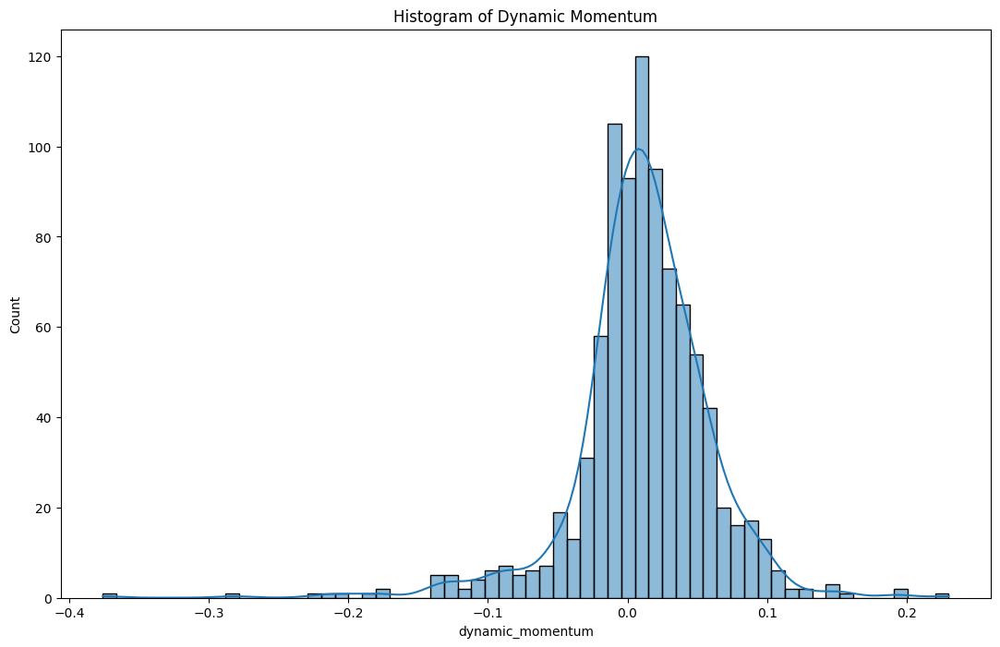

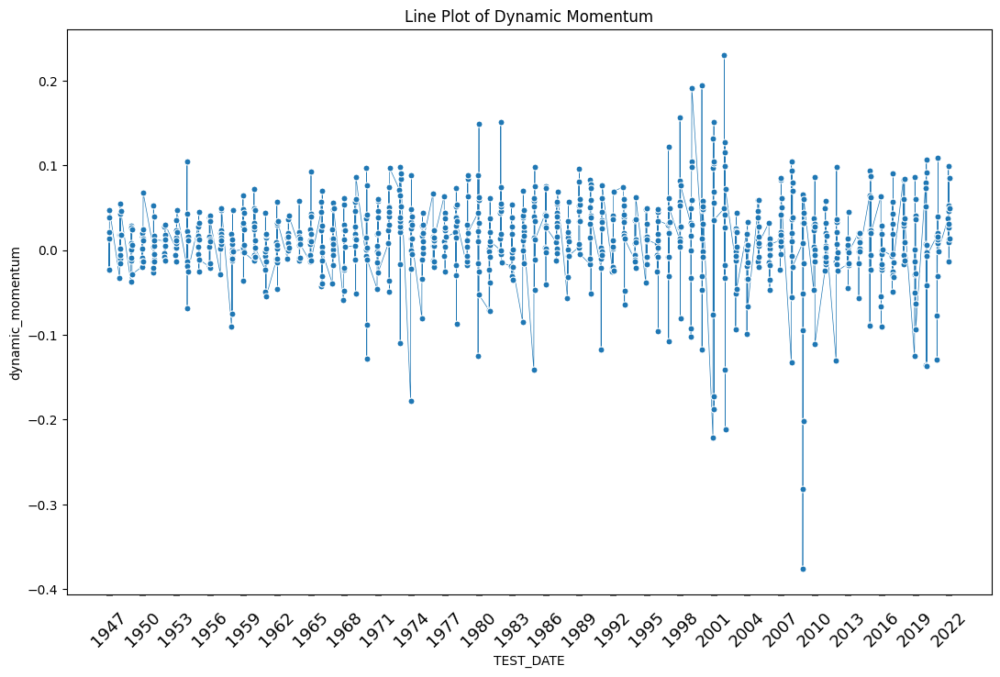

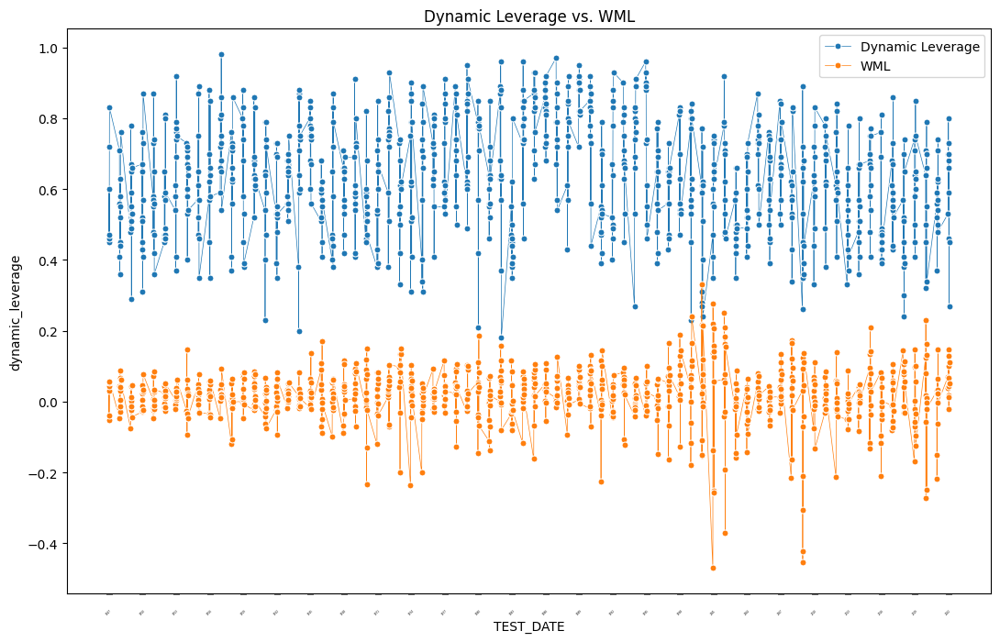

In [27]:
plot_dynamic_momentum(Fixed_RDF_Result)

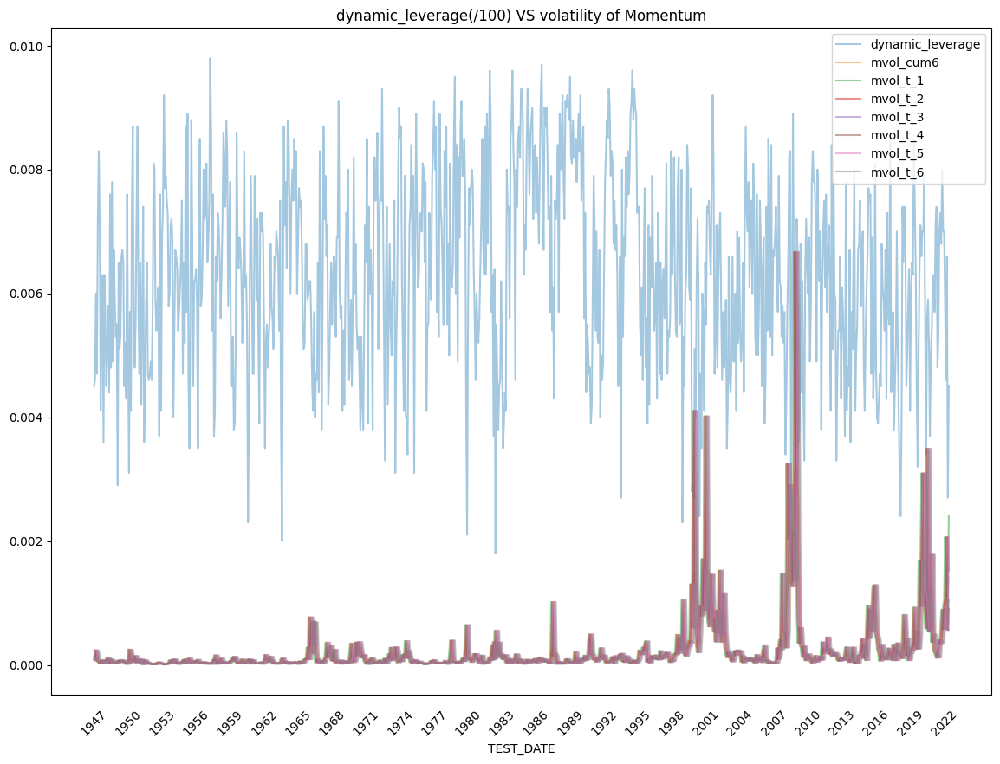

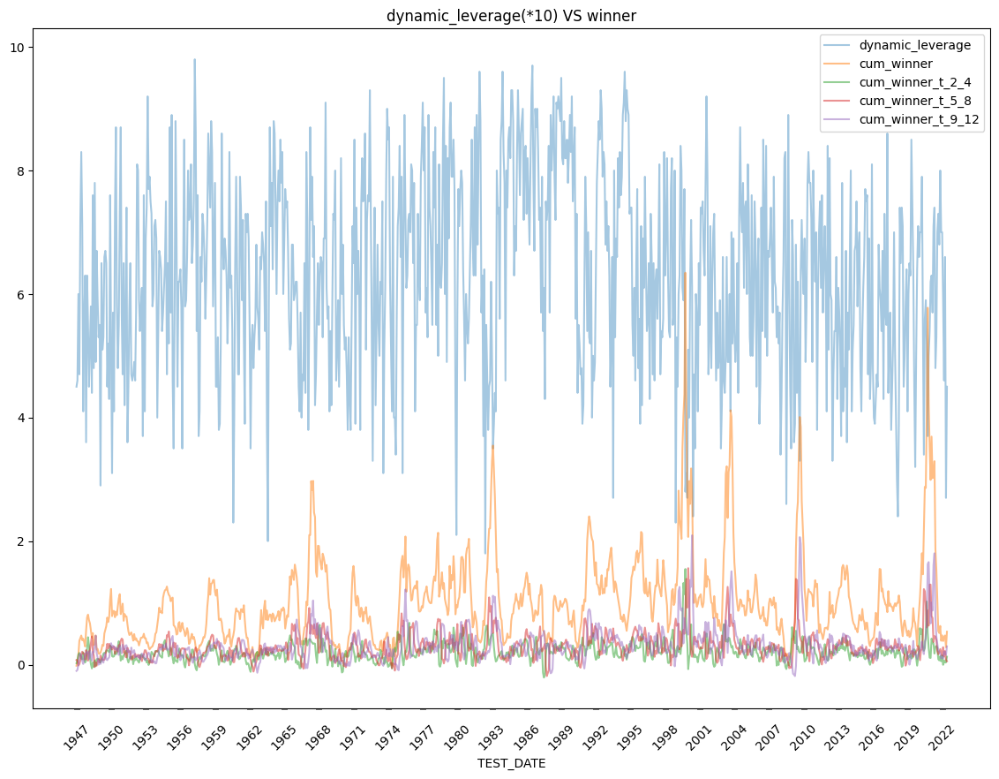

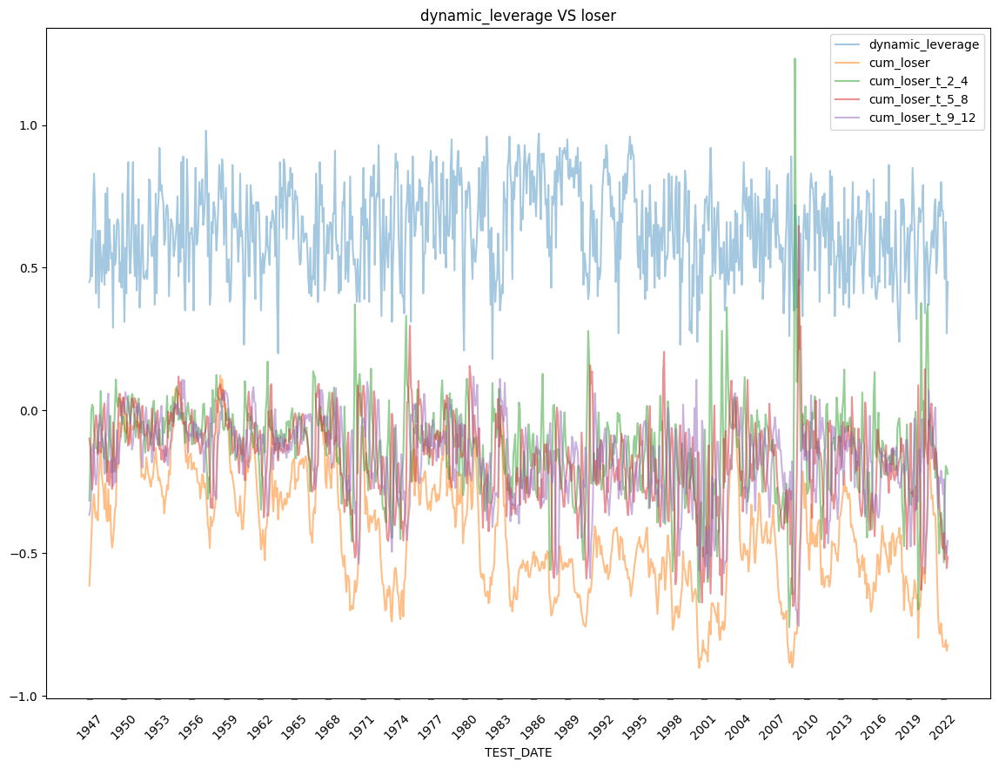

In [28]:
save_RDF = leverage_save(Fixed_RDF_Result, DATA)
save_RDF.to_csv(f'/content/drive/MyDrive/Fin_AI/save_data/csv/Tree/RDF_{case_name}.csv')


Feature Importance of the model



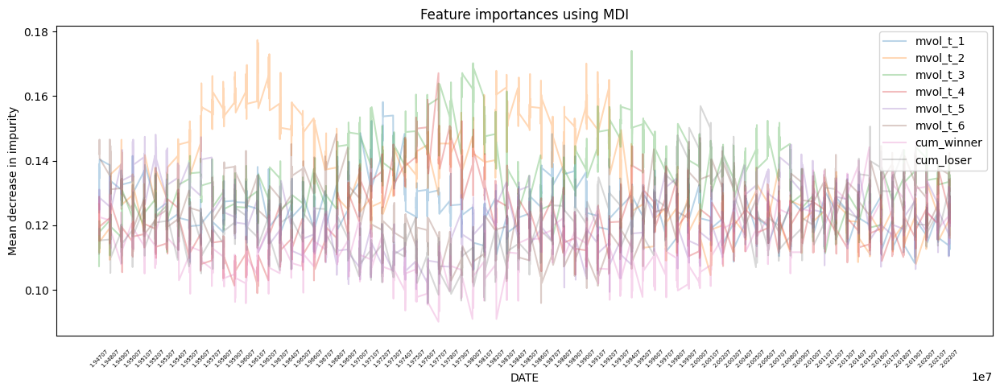

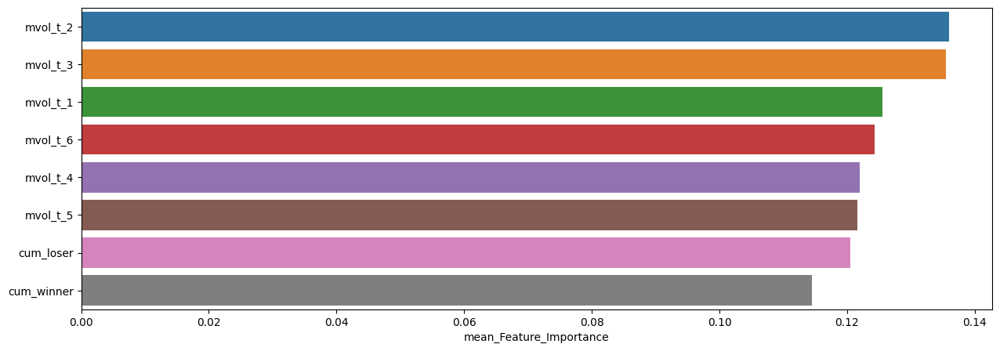

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.135942,0.177371,0.104547
mvol_t_3,0.135530,0.174074,0.107328
mvol_t_1,0.125570,0.158182,0.106345
mvol_t_6,0.124354,0.148251,0.095917
mvol_t_4,0.121937,0.167125,0.098983
mvol_t_5,0.121658,0.148102,0.095792
cum_loser,0.120480,0.156932,0.095900
cum_winner,0.114529,0.146038,0.090129


In [29]:
plot_feature_importances(Fixed_RDF_Result)


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.21      0.26        75
         1.0       0.67      0.79      0.73       151

    accuracy                           0.60       226
   macro avg       0.51      0.50      0.49       226
weighted avg       0.56      0.60      0.57       226


accuracy : 0.6017699115044248

precision : 0.6703910614525139

recall : 0.7947019867549668

F1-Score : 0.7272727272727273



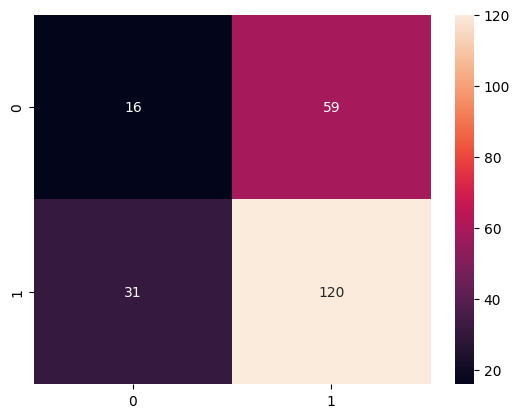


Feature Importance of the model



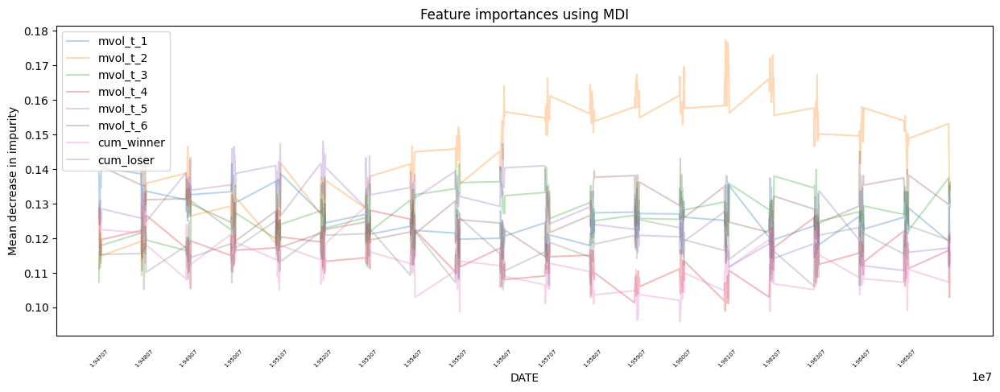

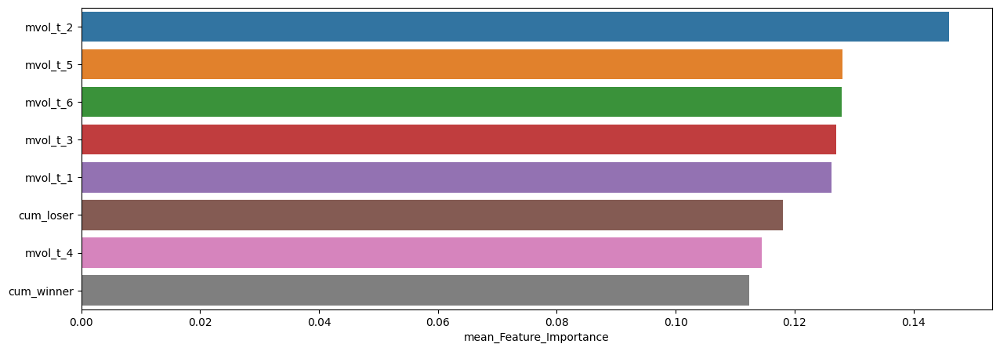

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.145957,0.177371,0.109286
mvol_t_5,0.128047,0.148102,0.106429
mvol_t_6,0.127950,0.146597,0.111049
mvol_t_3,0.126974,0.141480,0.107328
mvol_t_1,0.126274,0.141488,0.108605
cum_loser,0.118021,0.129997,0.105111
mvol_t_4,0.114463,0.131089,0.098983
cum_winner,0.112314,0.130713,0.095845



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.50      0.31      0.38        75
         1.0       0.71      0.85      0.77       151

    accuracy                           0.67       226
   macro avg       0.61      0.58      0.58       226
weighted avg       0.64      0.67      0.64       226


accuracy : 0.668141592920354

precision : 0.7111111111111111

recall : 0.847682119205298

F1-Score : 0.7734138972809668



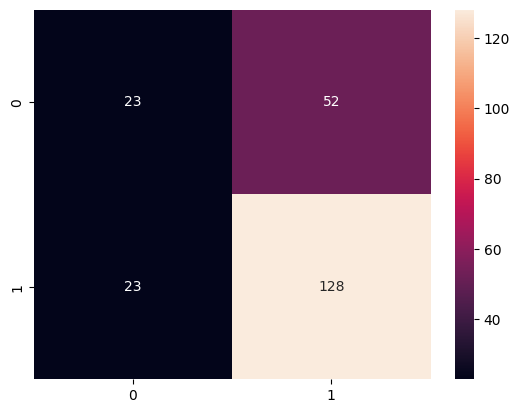


Feature Importance of the model



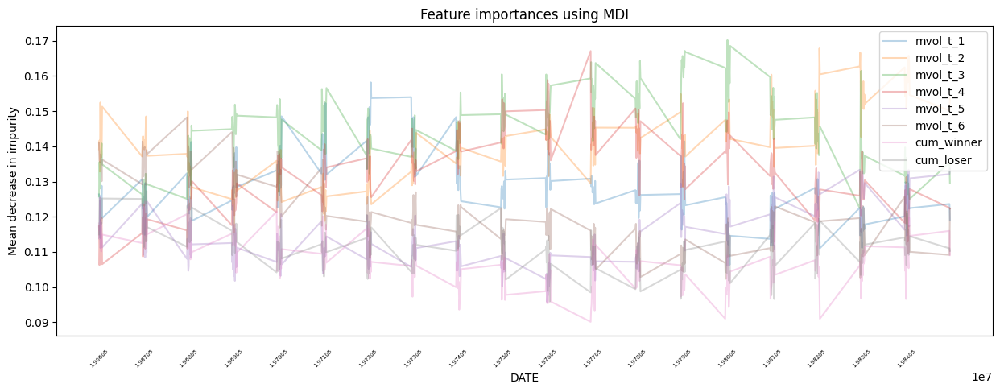

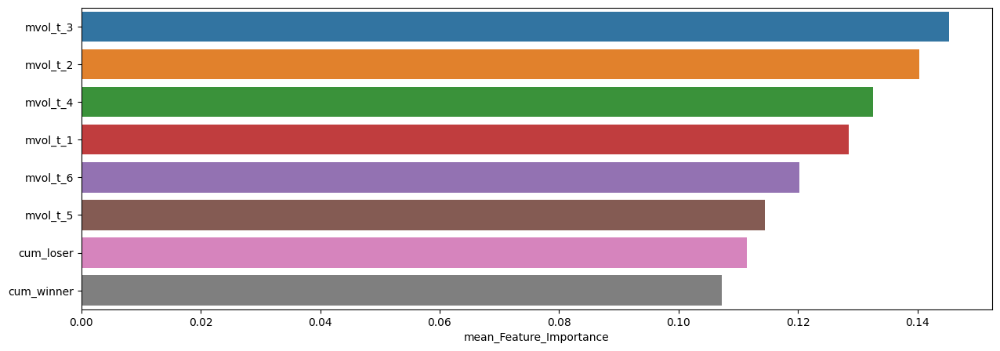

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.145244,0.170216,0.122432
mvol_t_2,0.140357,0.167862,0.115520
mvol_t_4,0.132606,0.167125,0.106277
mvol_t_1,0.128538,0.158182,0.106345
mvol_t_6,0.120167,0.148251,0.102355
mvol_t_5,0.114506,0.133655,0.095792
cum_loser,0.111374,0.129164,0.095900
cum_winner,0.107209,0.125602,0.090129



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.24      0.30        70
         1.0       0.71      0.84      0.77       156

    accuracy                           0.65       226
   macro avg       0.56      0.54      0.54       226
weighted avg       0.62      0.65      0.63       226


accuracy : 0.6548672566371682

precision : 0.7119565217391305

recall : 0.8397435897435898

F1-Score : 0.7705882352941177



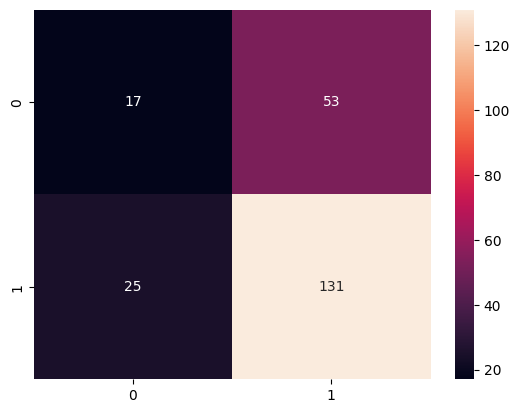


Feature Importance of the model



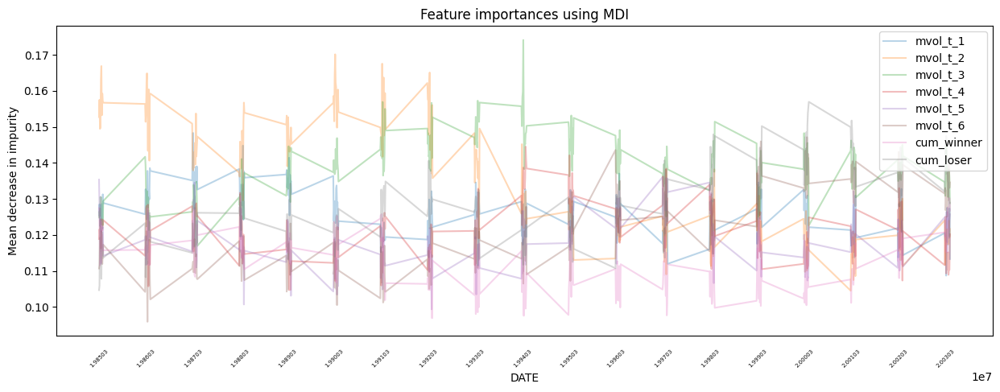

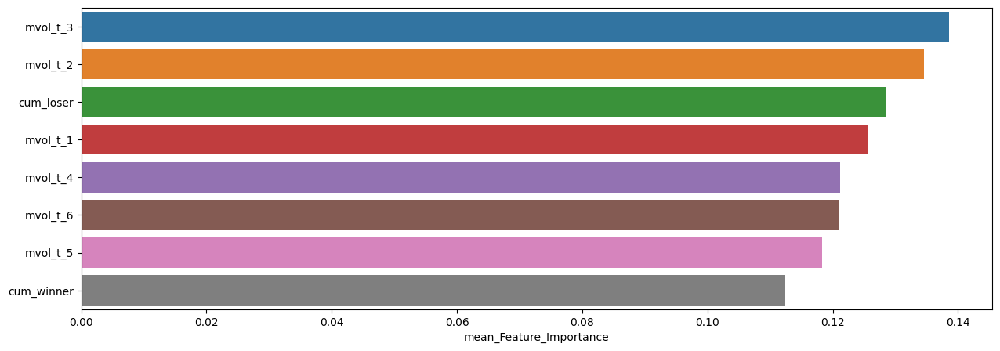

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.138534,0.174074,0.114034
mvol_t_2,0.134527,0.170102,0.104547
cum_loser,0.128429,0.156932,0.104700
mvol_t_1,0.125734,0.148295,0.108719
mvol_t_4,0.121184,0.144506,0.104707
mvol_t_6,0.120873,0.147121,0.095917
mvol_t_5,0.118273,0.136053,0.099370
cum_winner,0.112447,0.130835,0.096899



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.49      0.33      0.40        96
         1.0       0.61      0.75      0.67       132

    accuracy                           0.57       228
   macro avg       0.55      0.54      0.53       228
weighted avg       0.56      0.57      0.56       228


accuracy : 0.5745614035087719

precision : 0.6073619631901841

recall : 0.75

F1-Score : 0.6711864406779662



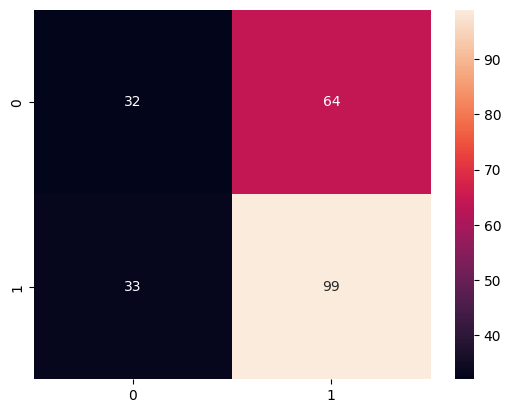


Feature Importance of the model



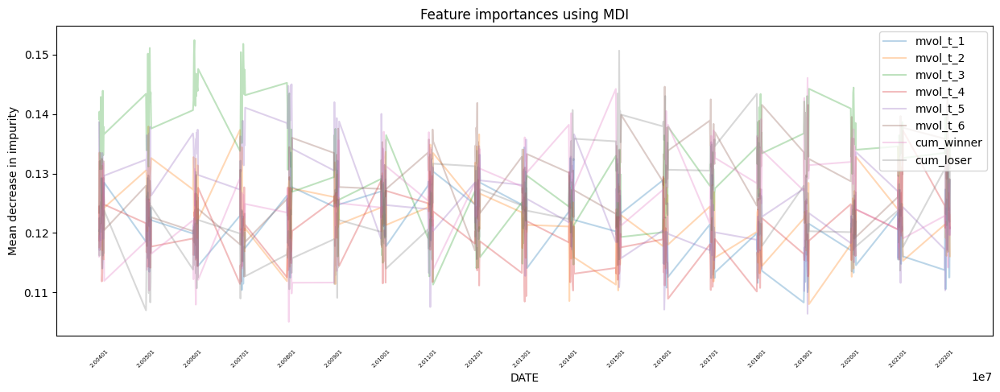

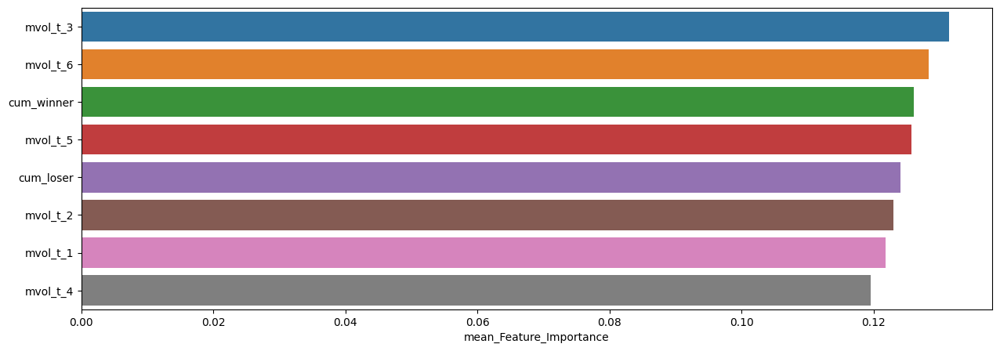

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_3,0.131404,0.152399,0.111335
mvol_t_6,0.128390,0.144578,0.112668
cum_winner,0.126044,0.146038,0.105084
mvol_t_5,0.125772,0.144981,0.106438
cum_loser,0.124066,0.150624,0.107013
mvol_t_2,0.123043,0.137896,0.108053
mvol_t_1,0.121767,0.134377,0.108327
mvol_t_4,0.119515,0.137198,0.108483


In [30]:
slice_feature_importance(Fixed_RDF_Result, 4)

## Grdient Boosting

In [31]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

In [32]:
Fixed_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=GBC) 

**************************************************
설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]

ORG Sharpe Ratio : 0.7293406994683723
ML Sharpe Ratio : 0.7758802220998534


최근 누적 수익률

  2022년-12월 -> 9707.02
  2022년-11월 -> 8955.97
  2022년-10월 -> 8911.28
  2022년-09월 -> 8011.85
  2022년-08월 -> 7535.76

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 14187.08
  2등 : 2008년-11월 -> 13756.82
  3등 : 2002년-09월 -> 13754.83
  4등 : 2009년-01월 -> 13458.06
  5등 : 2008년-12월 -> 13440.62
  6등 : 2002년-07월 -> 12853.48
  7등 : 2008년-10월 -> 12579.86
  8등 : 2002년-08월 -> 12534.80
  9등 : 2002년-06월 -> 12517.64
  10등 : 2008년-09월 -> 12051.88



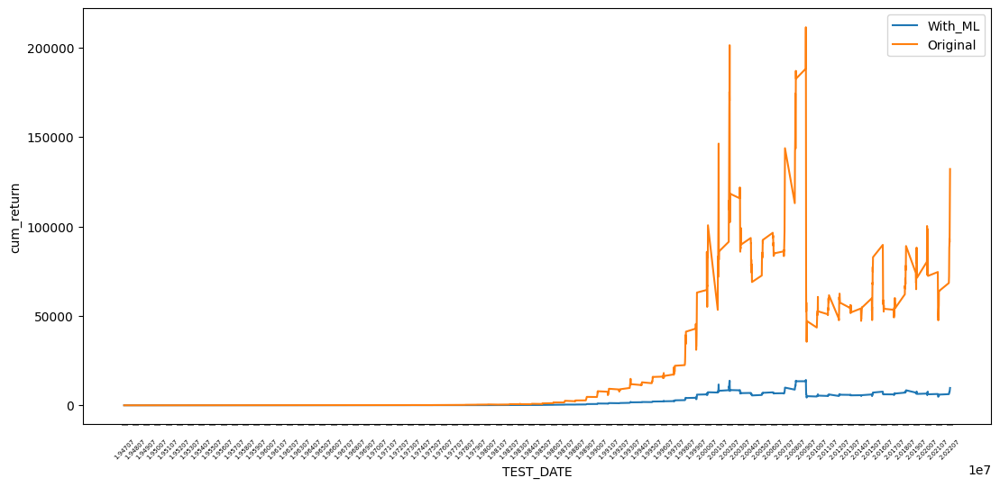

In [33]:
cum_return_sharpe_ratio(data=Fixed_GBC_Result, dynamic=True)


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.30      0.34       316
         1.0       0.67      0.76      0.71       590

    accuracy                           0.60       906
   macro avg       0.54      0.53      0.53       906
weighted avg       0.58      0.60      0.58       906


accuracy : 0.6004415011037527

precision : 0.6701492537313433

recall : 0.7610169491525424

F1-Score : 0.7126984126984127



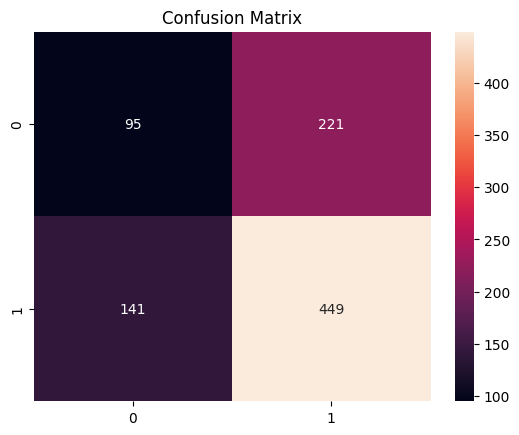


ACTUAL = PRED = 1



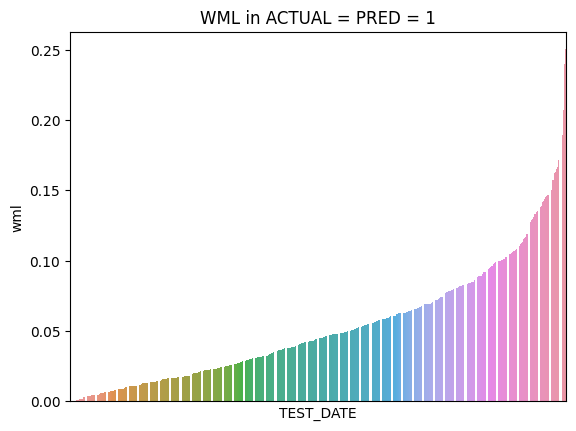

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,449.0,0.053081,0.001799,0.04242,0.000007,0.000725,0.020141,0.044931,0.074371,0.184703,0.250175


,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,449.0,0.042045,0.001252,0.035381,0.000006,0.000476,0.01444,0.034087,0.058213,0.152017,0.234305



--------------------------------------------------------------------------------


ACTUAL = PRED = 0



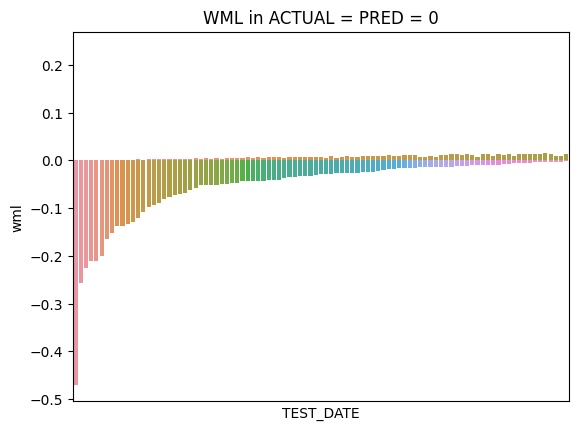

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,95.0,-0.053465,0.004894,0.069958,-0.469903,-0.270502,-0.05543,-0.028629,-0.013329,-0.002258,-0.000132


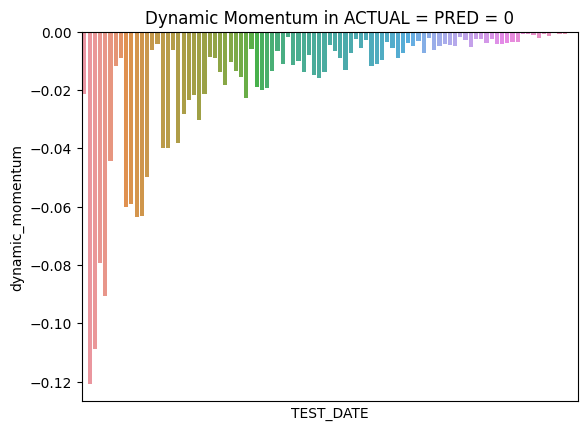

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,95.0,-0.01622,0.000529,0.023008,-0.120701,-0.109578,-0.017028,-0.007372,-0.003712,-0.000175,-0.000049



--------------------------------------------------------------------------------


ACTUAL = 0 & PRED = 1



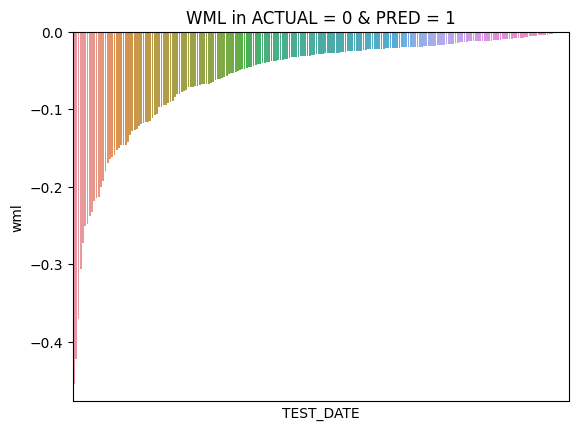

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,221.0,-0.057534,0.00517,0.071899,-0.454349,-0.35723,-0.069463,-0.028532,-0.016495,-0.000981,-0.000183


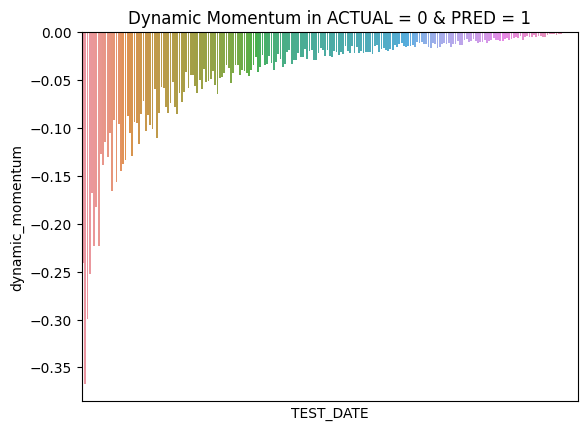

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,221.0,-0.042276,0.002854,0.053427,-0.367043,-0.249797,-0.050127,-0.021656,-0.01161,-0.000675,-0.00016



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



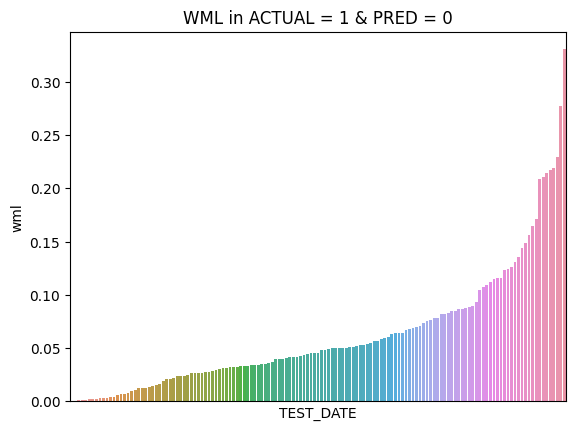

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,141.0,0.062157,0.003398,0.05829,0.000577,0.000882,0.026563,0.045577,0.08188,0.257799,0.330163


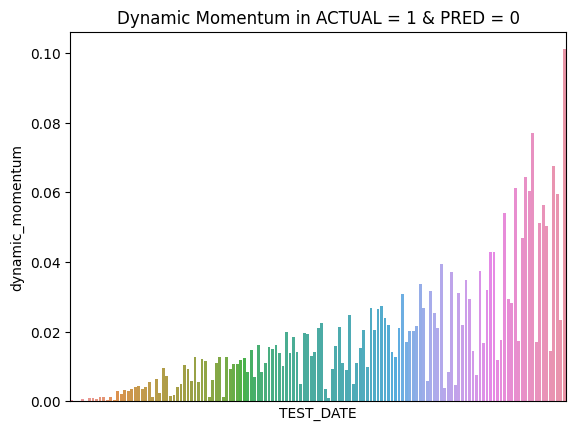

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,141.0,0.017686,0.000304,0.017434,0.000055,0.000167,0.005083,0.012839,0.022042,0.073159,0.100976


In [34]:
plot_predict_result(Fixed_GBC_Result)


Top 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_t_1,mvol_t_2,mvol_t_3,mvol_t_4,mvol_t_5,mvol_t_6,cum_winner,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,,,,
20020228,19820226,20020131,0.250175,0.234305,1.0,0.936563,1.0,0.126763,0.080985,0.150022,0.080412,0.103528,0.169843,0.148198,0.140249,10431.624474
19991231,19791231,19991130,0.239571,0.224014,1.0,0.935065,1.0,0.173292,0.102577,0.156542,0.097170,0.101019,0.119523,0.097006,0.152871,5966.388419
20010928,19810930,20010831,0.207369,0.190597,1.0,0.919119,1.0,0.135695,0.047523,0.145185,0.096918,0.152747,0.184117,0.102890,0.134925,11642.304207
19801128,19601130,19801031,0.186602,0.158010,1.0,0.846775,1.0,0.124893,0.148507,0.168765,0.179715,0.091192,0.127708,0.072660,0.086562,100.496162
19820630,19620629,19820528,0.157135,0.152356,1.0,0.969587,1.0,0.160725,0.156959,0.123450,0.146543,0.094918,0.091981,0.082023,0.143401,114.044613



Bottom 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_t_1,mvol_t_2,mvol_t_3,mvol_t_4,mvol_t_5,mvol_t_6,cum_winner,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,,,,
20090331,19890331,20090227,-0.422400,-0.367043,0.0,0.868946,1.0,0.134161,0.096573,0.127593,0.093244,0.171371,0.131331,0.106494,0.139233,8979.442419
20021129,19821130,20021031,-0.370041,-0.298970,0.0,0.807937,1.0,0.177123,0.084945,0.142593,0.067551,0.130245,0.099501,0.149752,0.148291,8037.476249
20090831,19890831,20090731,-0.305990,-0.252094,0.0,0.823864,1.0,0.127848,0.110030,0.117058,0.107561,0.160992,0.132975,0.117559,0.125976,4393.333273
20090430,19890428,20090331,-0.454349,-0.240608,0.0,0.529565,1.0,0.137189,0.084181,0.115138,0.111151,0.189878,0.137531,0.097222,0.127711,6818.680448
20011031,19811030,20010928,-0.250756,-0.223633,0.0,0.891834,1.0,0.137696,0.060688,0.158384,0.083084,0.143629,0.166936,0.101876,0.147707,9038.475722


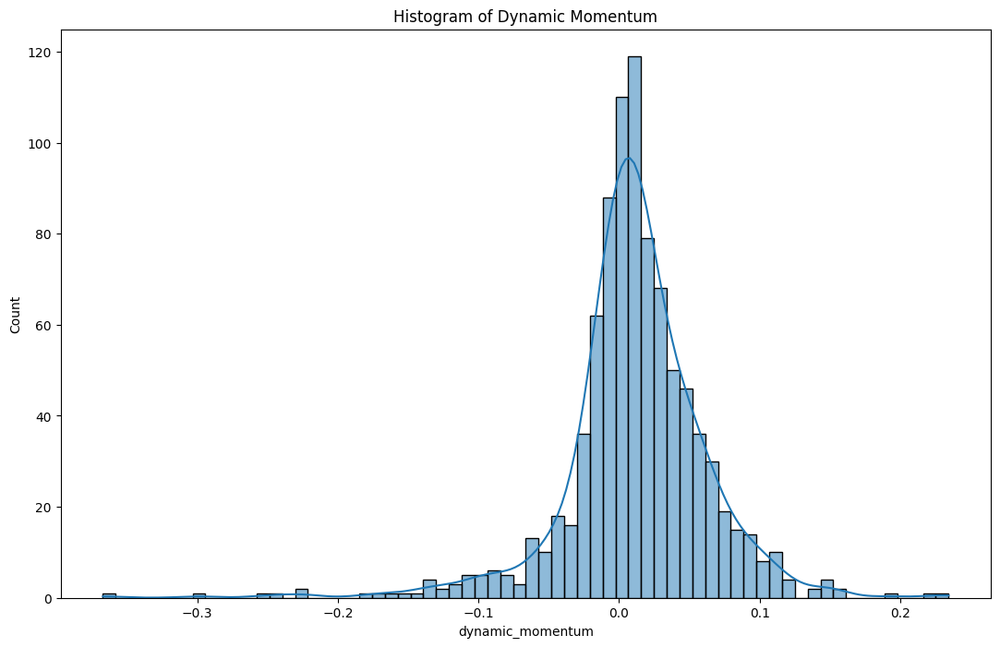

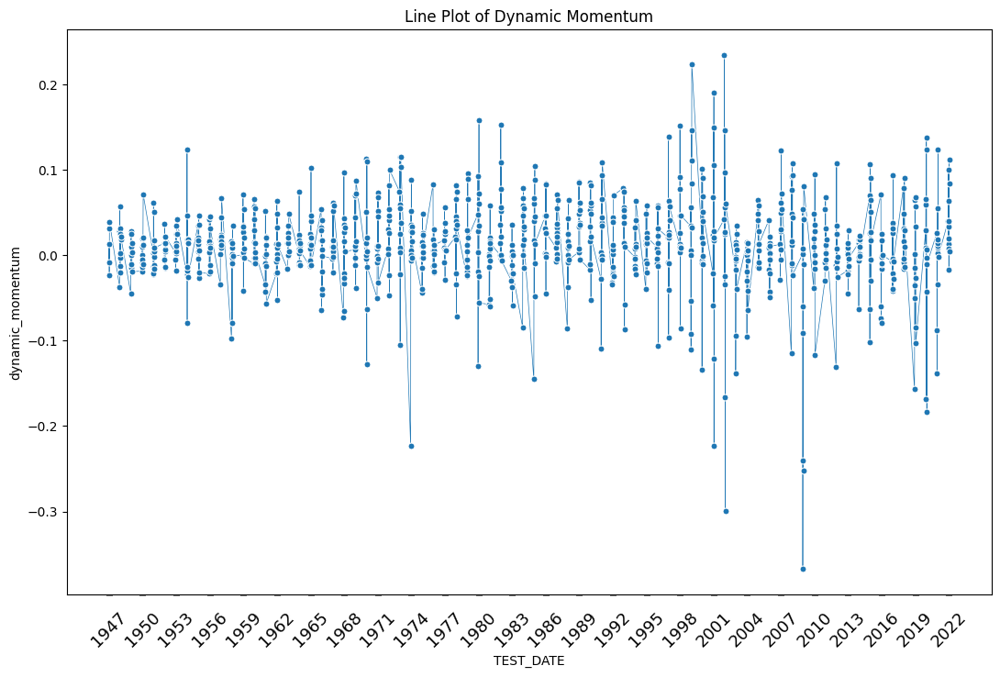

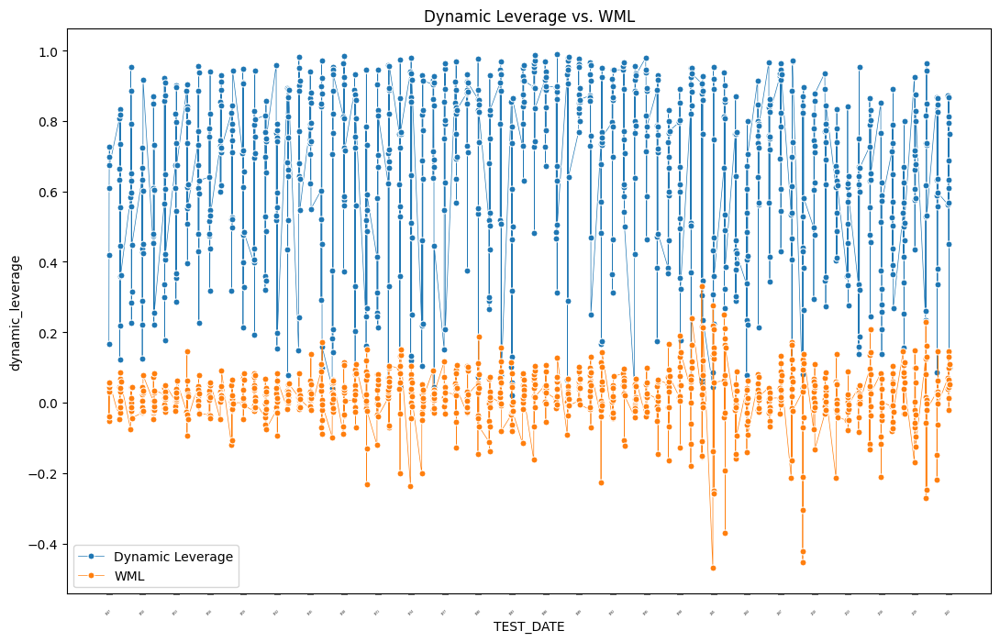

In [35]:
plot_dynamic_momentum(Fixed_GBC_Result)

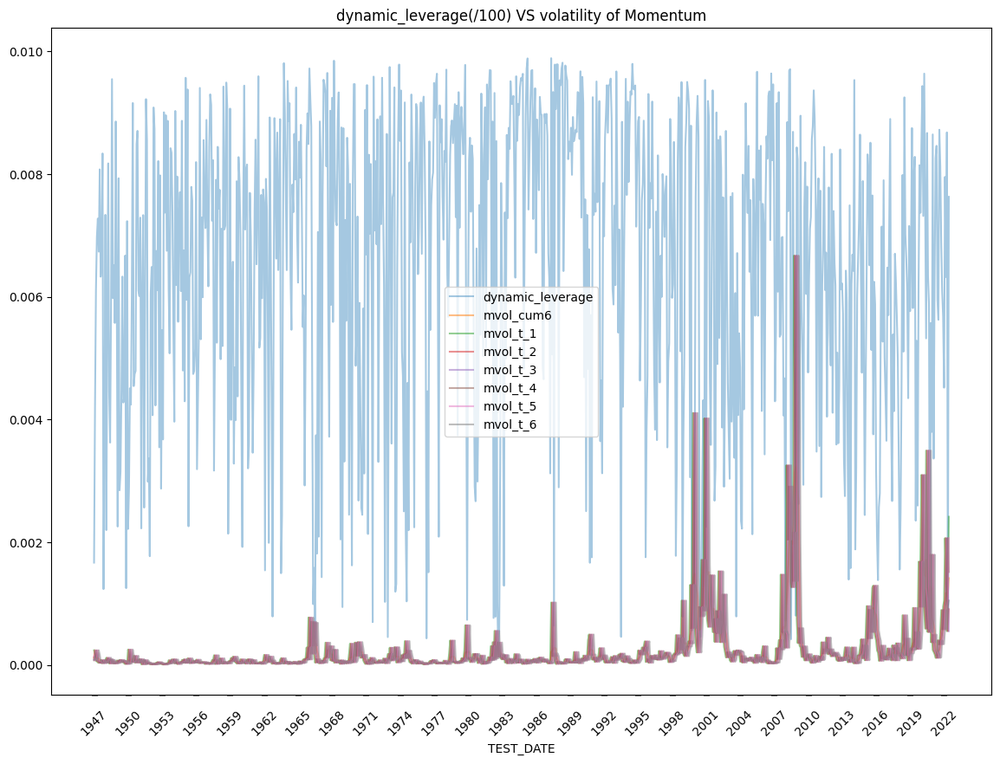

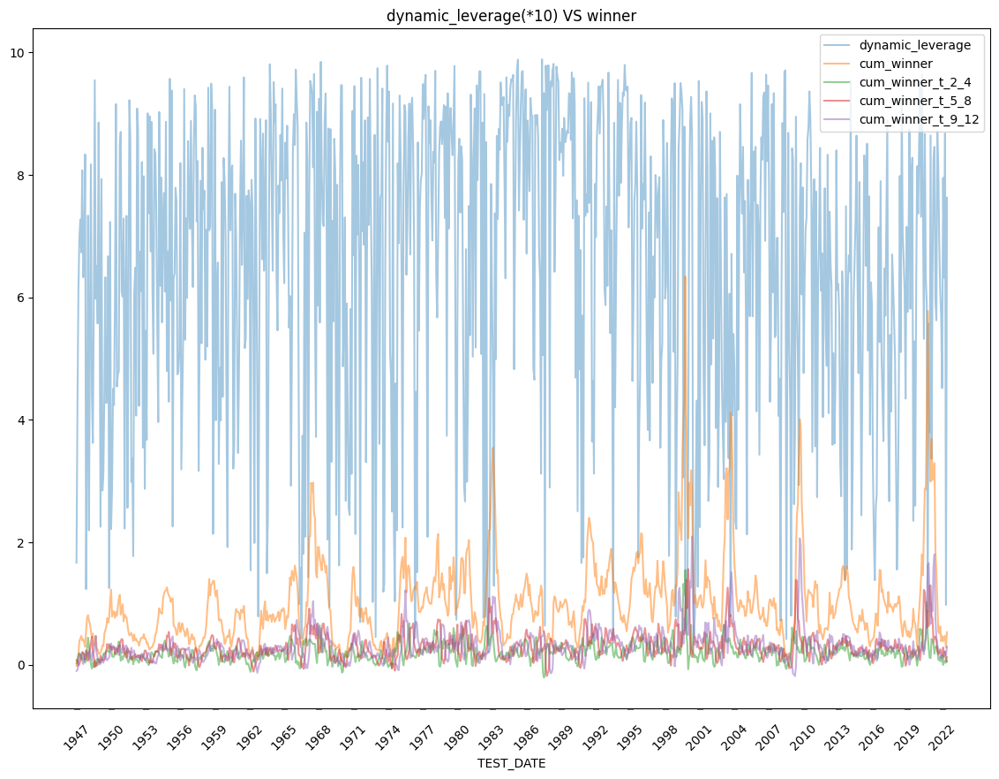

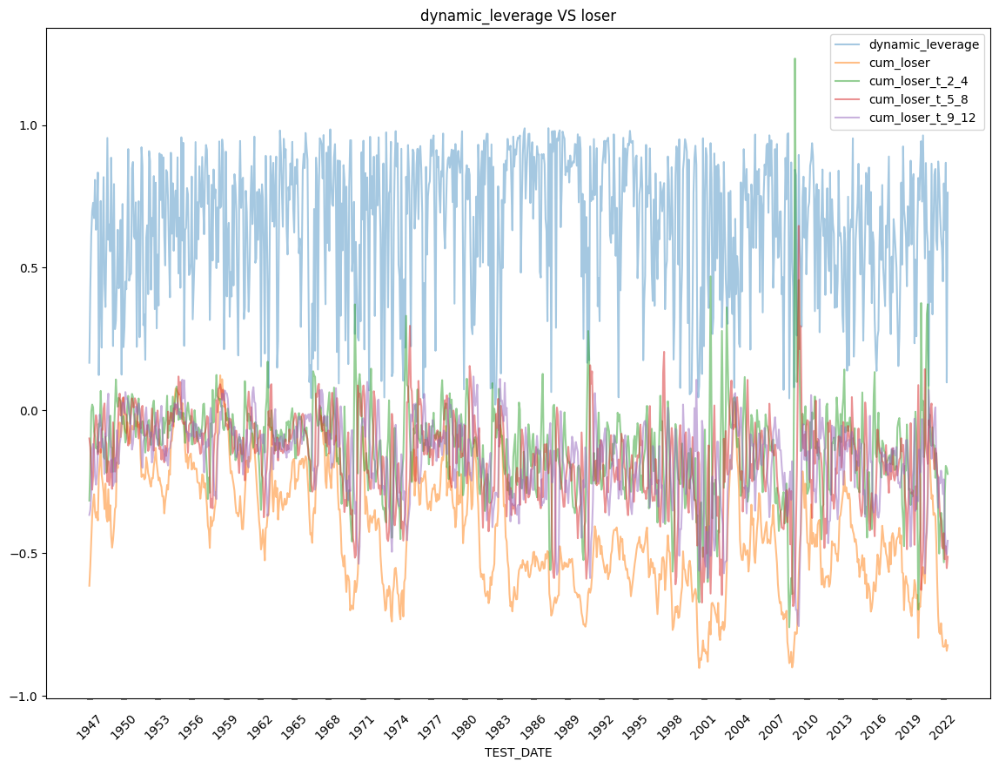

In [36]:
save_GBC = leverage_save(Fixed_GBC_Result, DATA)
save_GBC.to_csv(f'/content/drive/MyDrive/Fin_AI/save_data/csv/Tree/GBC_{case_name}.csv')


Feature Importance of the model



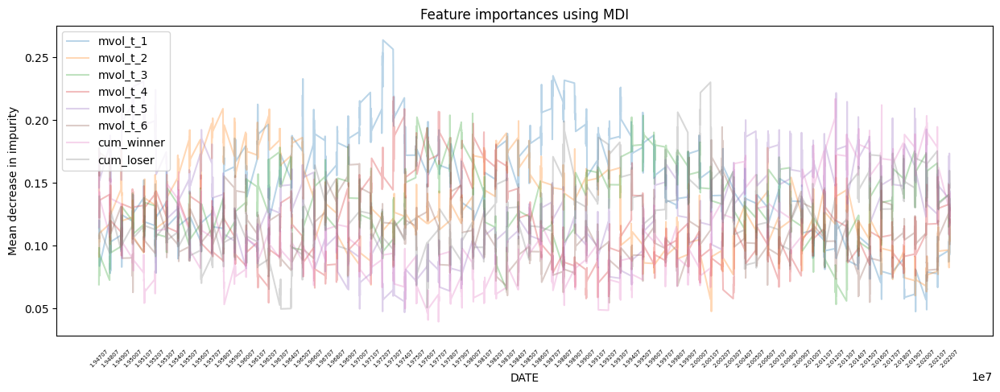

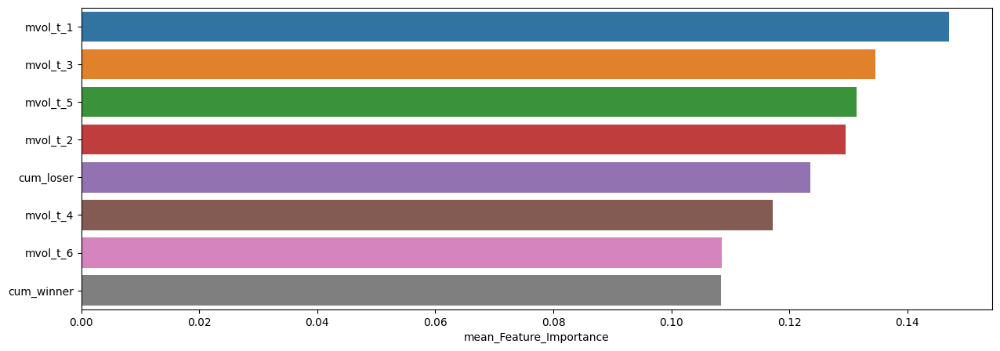

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.147019,0.263645,0.047399
mvol_t_3,0.134506,0.205201,0.053133
mvol_t_5,0.131382,0.230790,0.046760
mvol_t_2,0.129459,0.208968,0.047523
cum_loser,0.123564,0.230020,0.049530
mvol_t_4,0.117162,0.218457,0.054426
mvol_t_6,0.108514,0.194323,0.054464
cum_winner,0.108393,0.216827,0.039283


In [37]:
plot_feature_importances(Fixed_GBC_Result)


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.29      0.32        75
         1.0       0.68      0.74      0.71       151

    accuracy                           0.59       226
   macro avg       0.52      0.52      0.52       226
weighted avg       0.57      0.59      0.58       226


accuracy : 0.5929203539823009

precision : 0.6787878787878788

recall : 0.7417218543046358

F1-Score : 0.7088607594936708



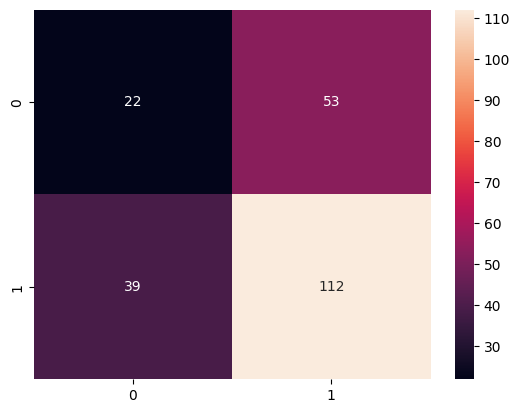


Feature Importance of the model



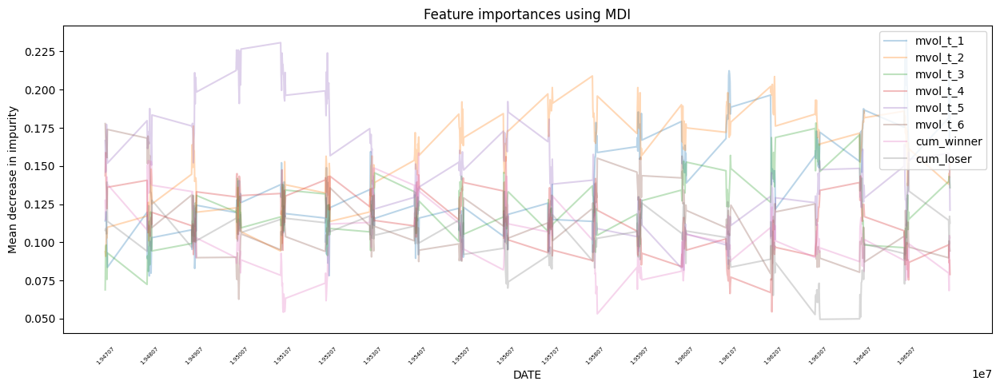

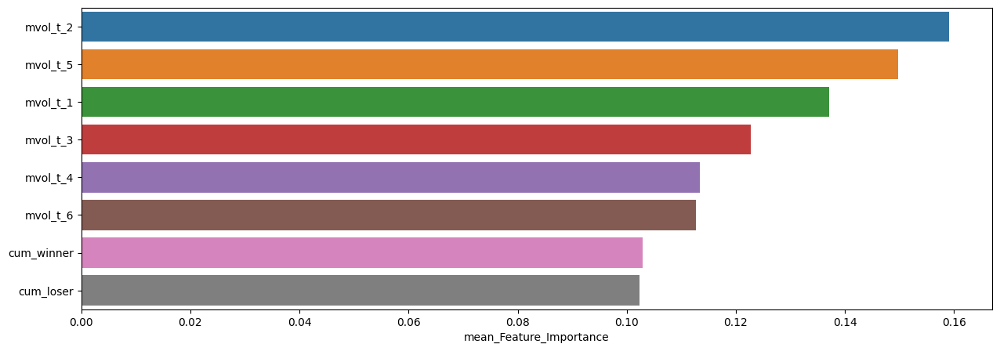

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.159036,0.208968,0.090833
mvol_t_5,0.149728,0.230790,0.081727
mvol_t_1,0.137141,0.232721,0.077978
mvol_t_3,0.122745,0.178167,0.068856
mvol_t_4,0.113419,0.158719,0.054426
mvol_t_6,0.112688,0.177745,0.062702
cum_winner,0.102916,0.158457,0.053111
cum_loser,0.102328,0.151937,0.049530



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.46      0.33      0.39        75
         1.0       0.71      0.81      0.76       151

    accuracy                           0.65       226
   macro avg       0.59      0.57      0.57       226
weighted avg       0.63      0.65      0.63       226


accuracy : 0.6504424778761062

precision : 0.7093023255813954

recall : 0.8079470198675497

F1-Score : 0.7554179566563468



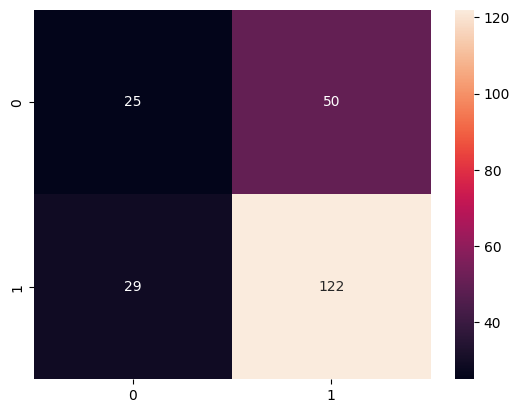


Feature Importance of the model



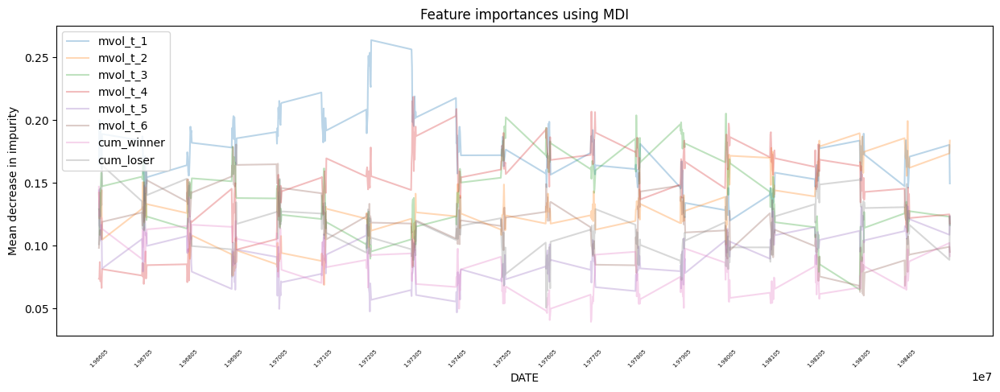

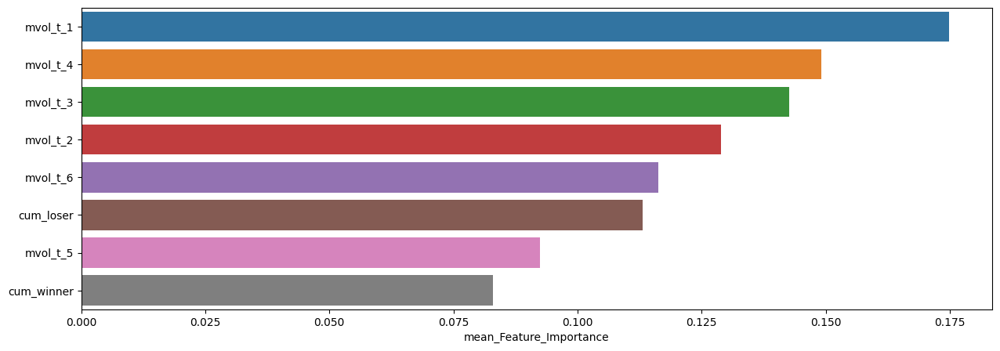

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.174792,0.263645,0.120023
mvol_t_4,0.149028,0.218457,0.066265
mvol_t_3,0.142584,0.205201,0.064894
mvol_t_2,0.128882,0.199220,0.068643
mvol_t_6,0.116270,0.180483,0.060227
cum_loser,0.113106,0.163936,0.050549
mvol_t_5,0.092439,0.147534,0.046760
cum_winner,0.082901,0.146943,0.039283



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.38      0.30      0.34        70
         1.0       0.71      0.78      0.75       156

    accuracy                           0.63       226
   macro avg       0.55      0.54      0.54       226
weighted avg       0.61      0.63      0.62       226


accuracy : 0.6327433628318584

precision : 0.7134502923976608

recall : 0.782051282051282

F1-Score : 0.746177370030581



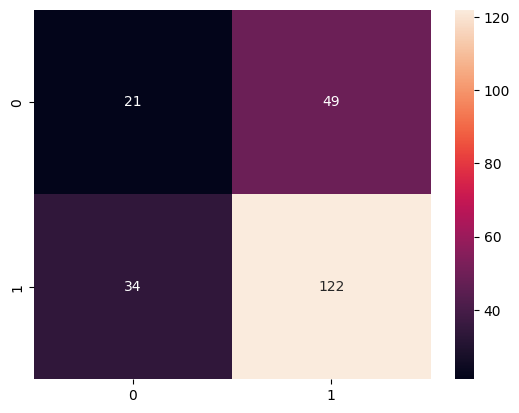


Feature Importance of the model



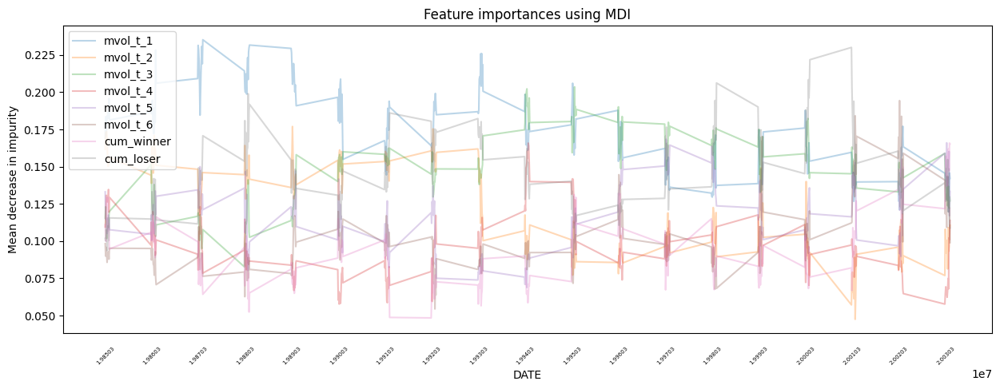

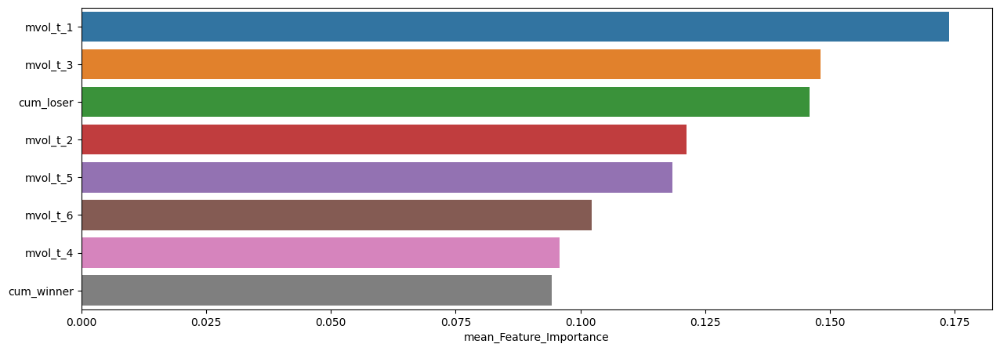

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.173805,0.235180,0.119653
mvol_t_3,0.148142,0.203515,0.082773
cum_loser,0.145939,0.230020,0.093707
mvol_t_2,0.121287,0.176930,0.047523
mvol_t_5,0.118358,0.168386,0.068868
mvol_t_6,0.102331,0.194323,0.054464
mvol_t_4,0.095840,0.165782,0.057726
cum_winner,0.094298,0.165813,0.048454



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.28      0.33        96
         1.0       0.57      0.70      0.63       132

    accuracy                           0.53       228
   macro avg       0.49      0.49      0.48       228
weighted avg       0.50      0.53      0.51       228


accuracy : 0.5263157894736842

precision : 0.5740740740740741

recall : 0.7045454545454546

F1-Score : 0.6326530612244898



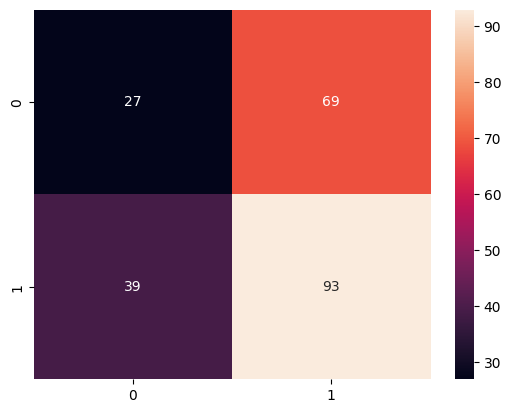


Feature Importance of the model



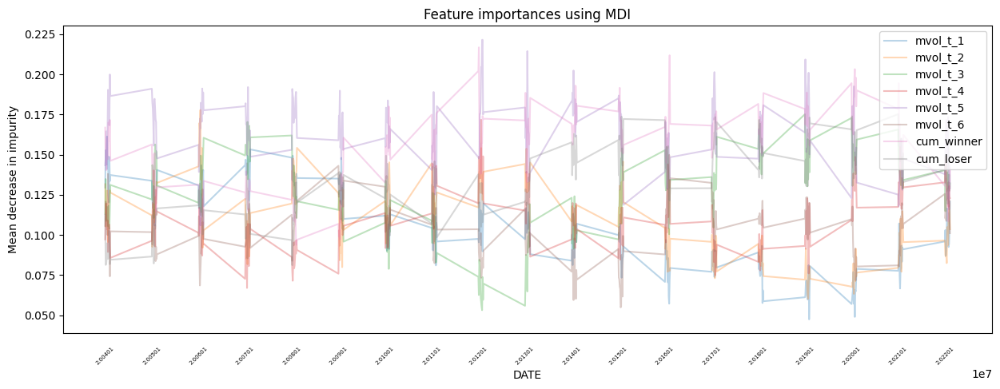

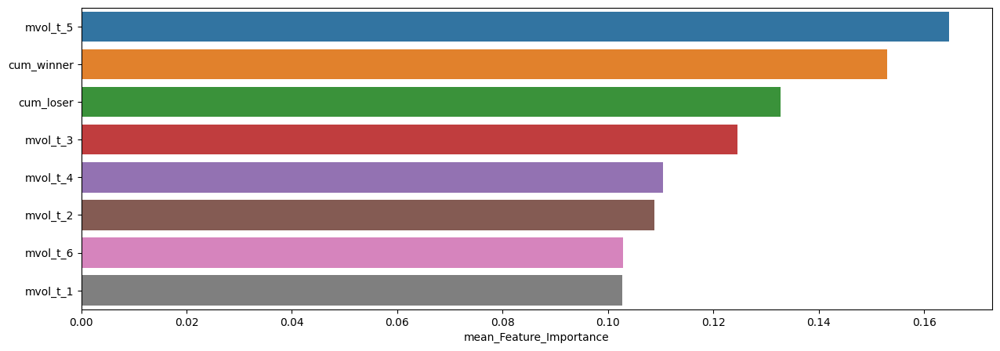

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.164710,0.221541,0.115940
cum_winner,0.153061,0.216827,0.093850
cum_loser,0.132803,0.175224,0.081107
mvol_t_3,0.124641,0.175177,0.053133
mvol_t_4,0.110420,0.171719,0.066967
mvol_t_2,0.108815,0.177853,0.060192
mvol_t_6,0.102820,0.149828,0.054870
mvol_t_1,0.102730,0.161289,0.047399


In [38]:
slice_feature_importance(Fixed_GBC_Result, 4)

## XGB

In [39]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

In [40]:
Fixed_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB) 

**************************************************
설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : None
   tree_method : None
   validate_paramete

  0%|          | 0/906 [00:00<?, ?it/s]

ORG Sharpe Ratio : 0.7293406994683723
ML Sharpe Ratio : 0.8455172173991293


최근 누적 수익률

  2022년-12월 -> 41680.73
  2022년-11월 -> 38679.48
  2022년-10월 -> 38623.06
  2022년-09월 -> 35740.21
  2022년-08월 -> 35403.39

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 56579.54
  2등 : 2008년-11월 -> 55589.66
  3등 : 2009년-01월 -> 54415.49
  4등 : 2008년-12월 -> 54282.15
  5등 : 2008년-10월 -> 51336.14
  6등 : 2008년-09월 -> 48959.18
  7등 : 2008년-06월 -> 47739.08
  8등 : 2008년-07월 -> 47714.58
  9등 : 2008년-08월 -> 47488.65
  10등 : 2002년-09월 -> 46841.35



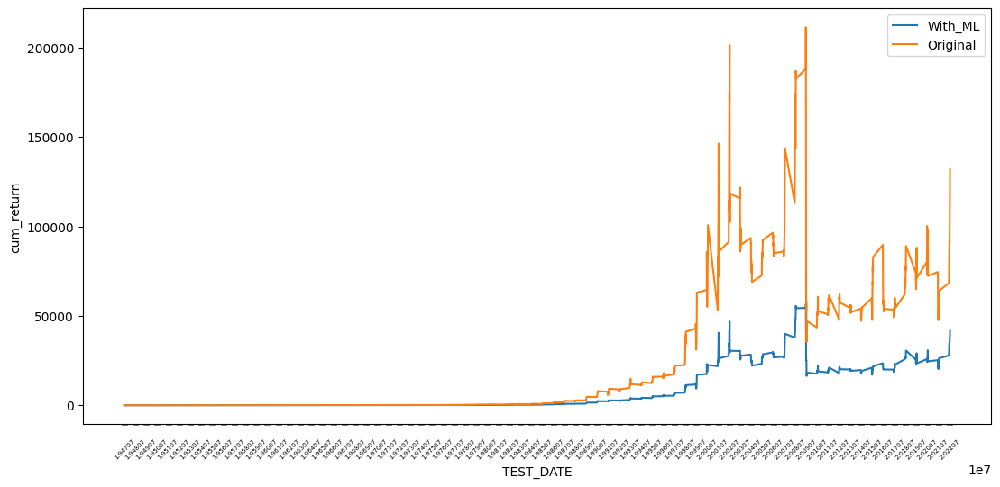

In [41]:
cum_return_sharpe_ratio(data=Fixed_XGB_Result,
                        dynamic=True)


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.39      0.41       316
         1.0       0.69      0.74      0.71       590

    accuracy                           0.61       906
   macro avg       0.57      0.56      0.56       906
weighted avg       0.60      0.61      0.61       906


accuracy : 0.6147902869757175

precision : 0.6921850079744817

recall : 0.735593220338983

F1-Score : 0.7132292522596548



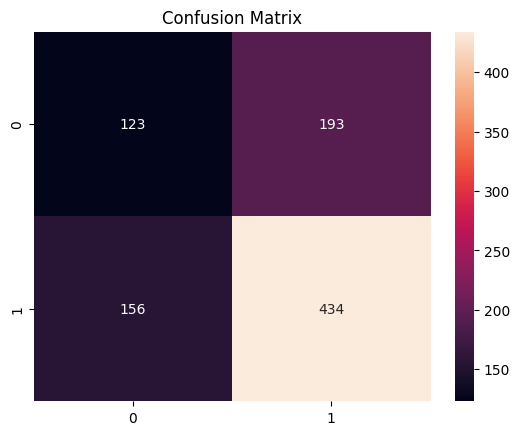


ACTUAL = PRED = 1



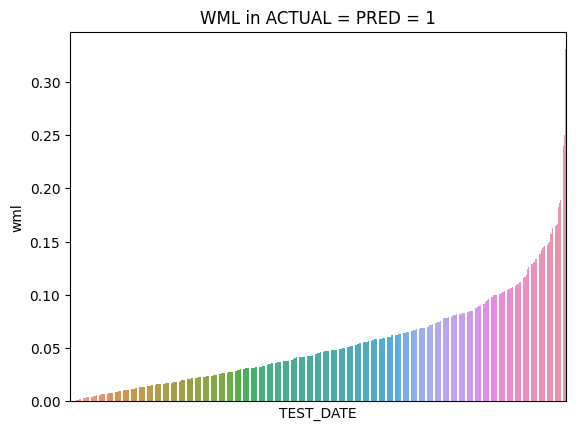

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,434.0,0.054548,0.001947,0.044123,0.000007,0.000765,0.022095,0.045319,0.076584,0.188358,0.330163


,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,434.0,0.047636,0.001632,0.040397,0.000006,0.000654,0.017894,0.03851,0.065833,0.173516,0.324752



--------------------------------------------------------------------------------


ACTUAL = PRED = 0



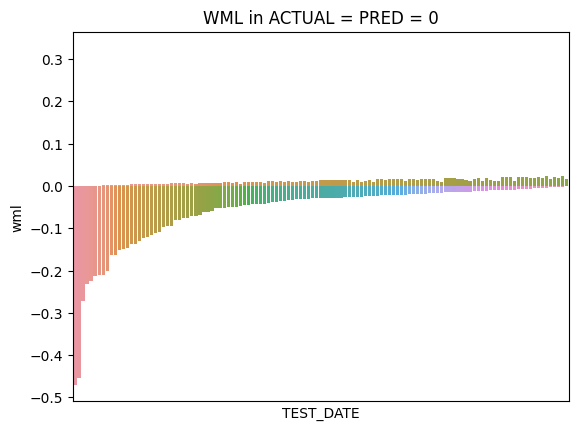

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,123.0,-0.059034,0.006024,0.077618,-0.469903,-0.414226,-0.069394,-0.028629,-0.015211,-0.002407,-0.000506


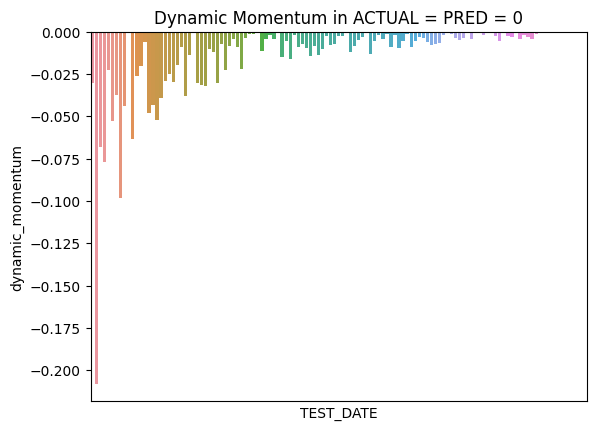

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,123.0,-0.013569,0.000609,0.024684,-0.208056,-0.093529,-0.013554,-0.00514,-0.001424,-0.000113,-0.000095



--------------------------------------------------------------------------------


ACTUAL = 0 & PRED = 1



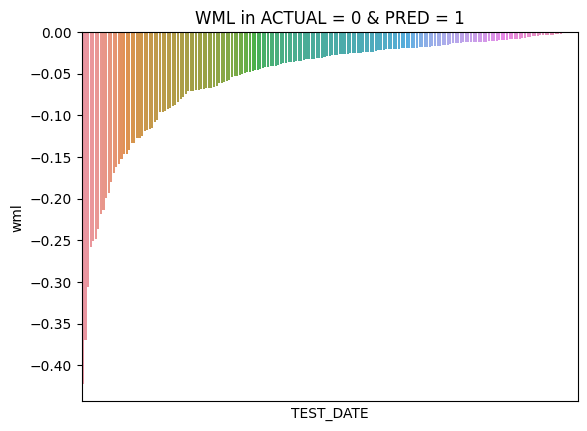

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,193.0,-0.054575,0.004489,0.067003,-0.4224,-0.311114,-0.067845,-0.028532,-0.013863,-0.000895,-0.000132


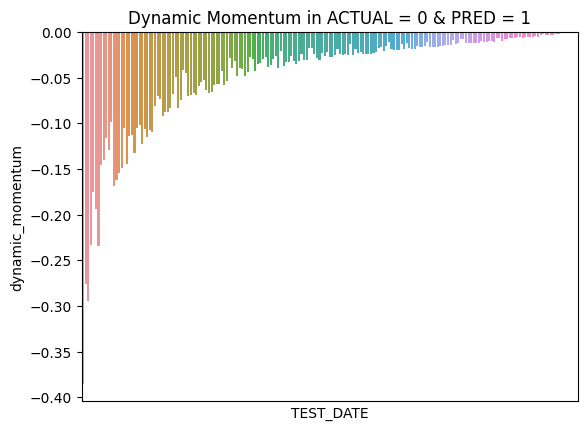

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,193.0,-0.04576,0.003229,0.056826,-0.385264,-0.277063,-0.056903,-0.024426,-0.012244,-0.000615,-0.000109



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



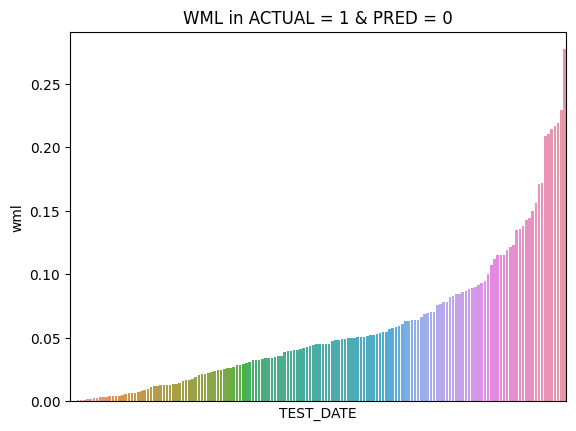

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,156.0,0.057202,0.002883,0.053694,0.000577,0.000754,0.018846,0.045009,0.077016,0.223565,0.276912


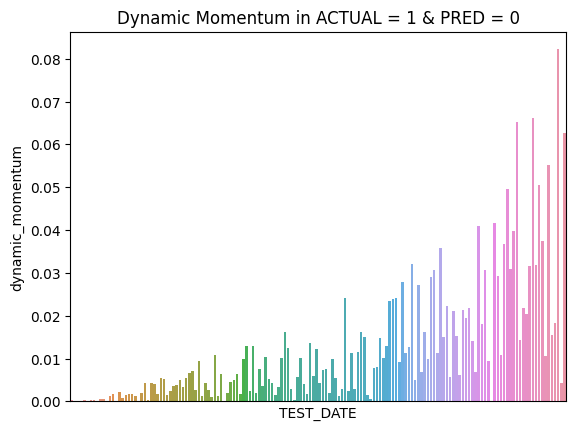

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,156.0,0.012344,0.000222,0.014907,0.000053,0.000079,0.002039,0.006764,0.01558,0.065614,0.082178


In [42]:
plot_predict_result(Fixed_XGB_Result)


Top 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_t_1,mvol_t_2,mvol_t_3,mvol_t_4,mvol_t_5,mvol_t_6,cum_winner,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,,,,
20000229,19800229,20000131,0.330163,0.324752,1.0,0.983612,1,0.126809,0.131288,0.118108,0.100397,0.108507,0.122006,0.151137,0.141747,23096.905947
20020228,19820226,20020131,0.250175,0.249369,1.0,0.996777,1,0.120016,0.122515,0.128744,0.084388,0.134664,0.122821,0.139737,0.147115,34538.629979
19991231,19791231,19991130,0.239571,0.237145,1.0,0.989875,1,0.133651,0.120439,0.146293,0.112689,0.131497,0.111271,0.124691,0.119469,17083.084427
19980630,19780630,19980529,0.189223,0.188146,1.0,0.994310,1,0.111894,0.095110,0.121819,0.102061,0.162555,0.130821,0.134400,0.141339,9385.905977
19801128,19601130,19801031,0.186602,0.178612,1.0,0.957186,1,0.128215,0.169566,0.144375,0.143933,0.113067,0.103826,0.103986,0.093033,179.690001



Bottom 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_t_1,mvol_t_2,mvol_t_3,mvol_t_4,mvol_t_5,mvol_t_6,cum_winner,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,,,,
20090331,19890331,20090227,-0.422400,-0.385264,0.0,0.912083,1,0.135915,0.165620,0.115152,0.103391,0.163888,0.100136,0.121740,0.094157,34781.093130
20090831,19890831,20090731,-0.305990,-0.294400,0.0,0.962124,1,0.118846,0.134612,0.116068,0.113333,0.142346,0.113752,0.149668,0.111374,16640.737654
20021129,19821130,20021031,-0.370041,-0.275555,0.0,0.744661,1,0.144810,0.096230,0.144150,0.101968,0.142709,0.109134,0.125789,0.135210,29530.347794
19740131,19540129,19731231,-0.237095,-0.233864,0.0,0.986373,1,0.162236,0.128510,0.132076,0.156384,0.085148,0.132240,0.097493,0.105912,36.239570
20011130,19811130,20011031,-0.257774,-0.233592,0.0,0.906187,1,0.134995,0.113922,0.107110,0.093772,0.155715,0.121125,0.126242,0.147120,25624.688950


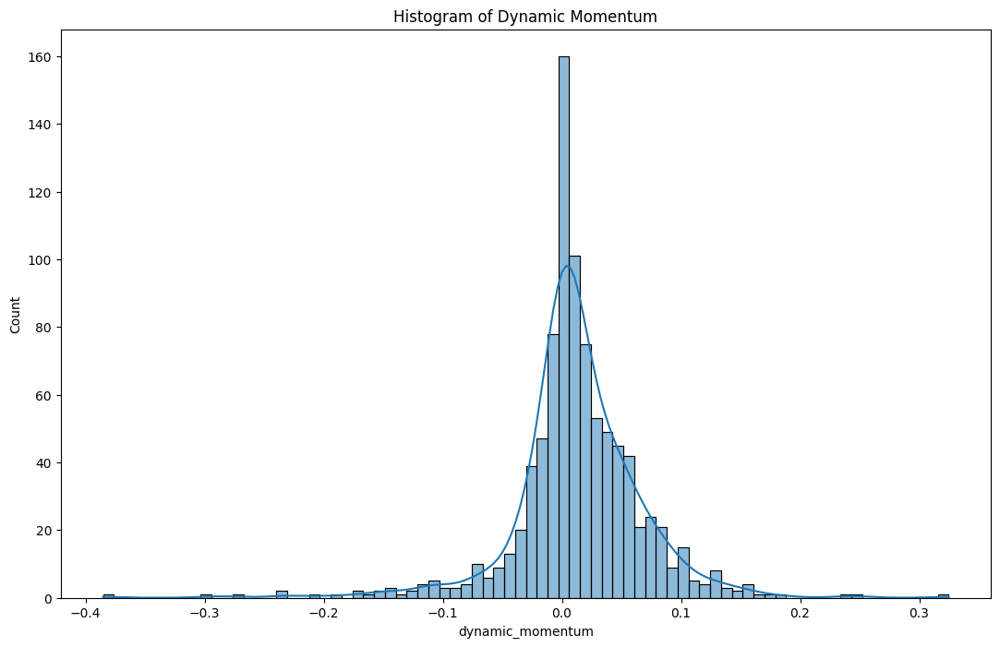

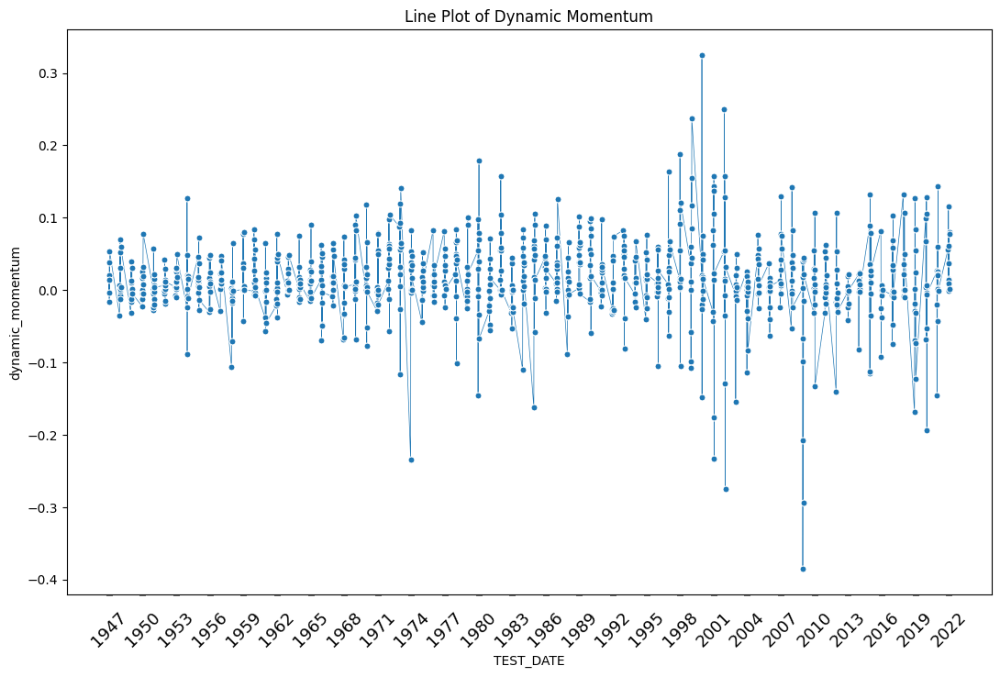

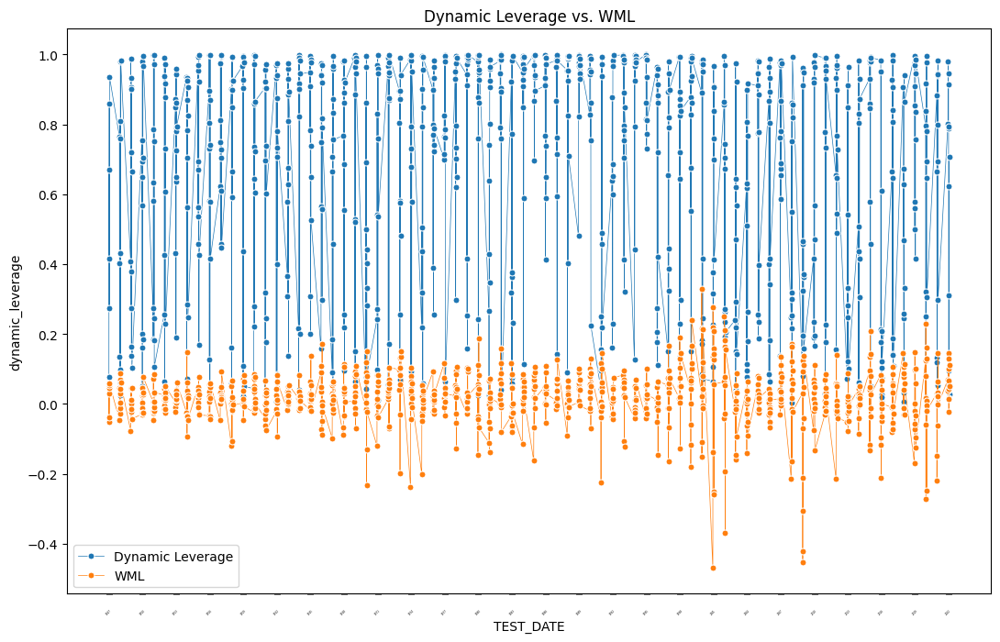

In [43]:
plot_dynamic_momentum(Fixed_XGB_Result)

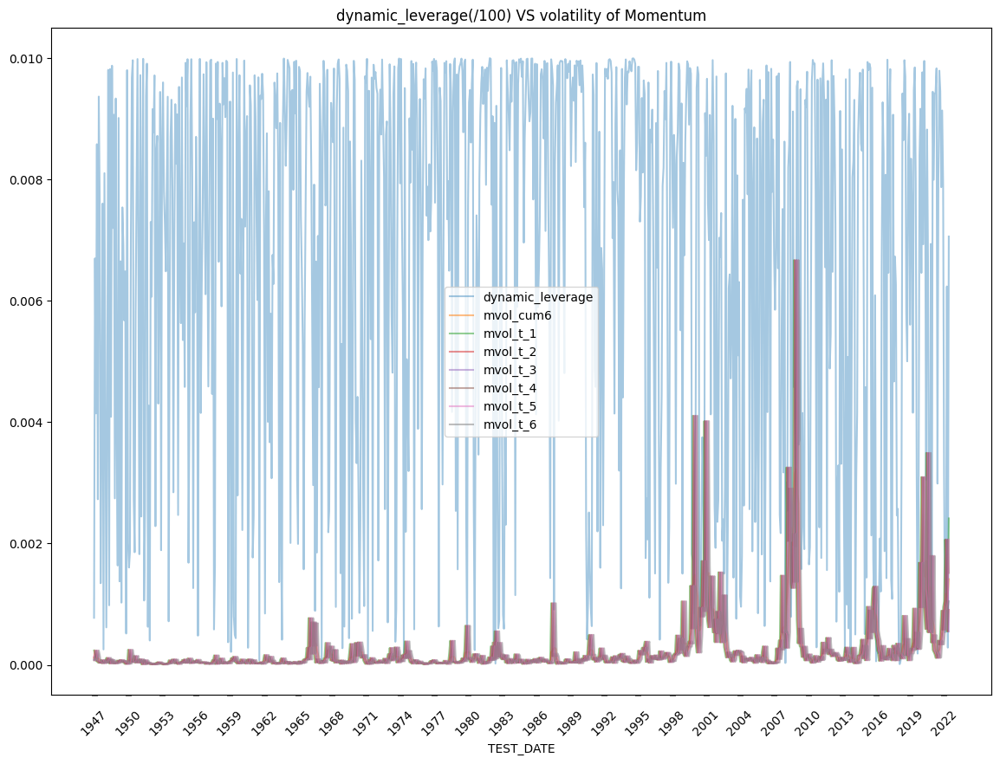

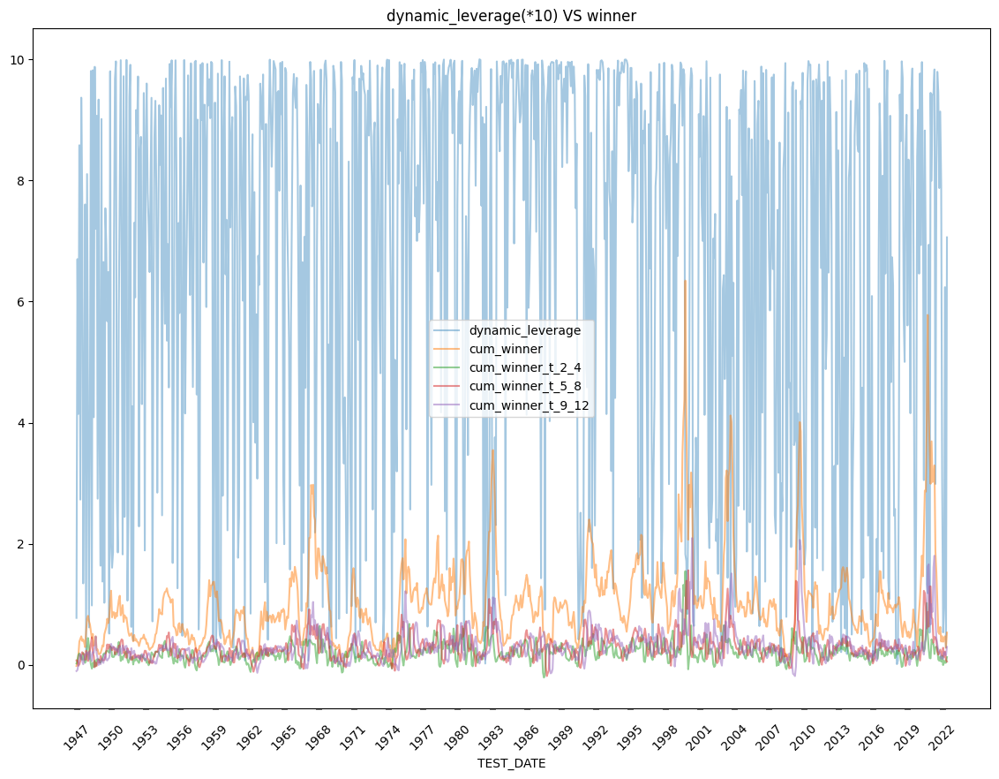

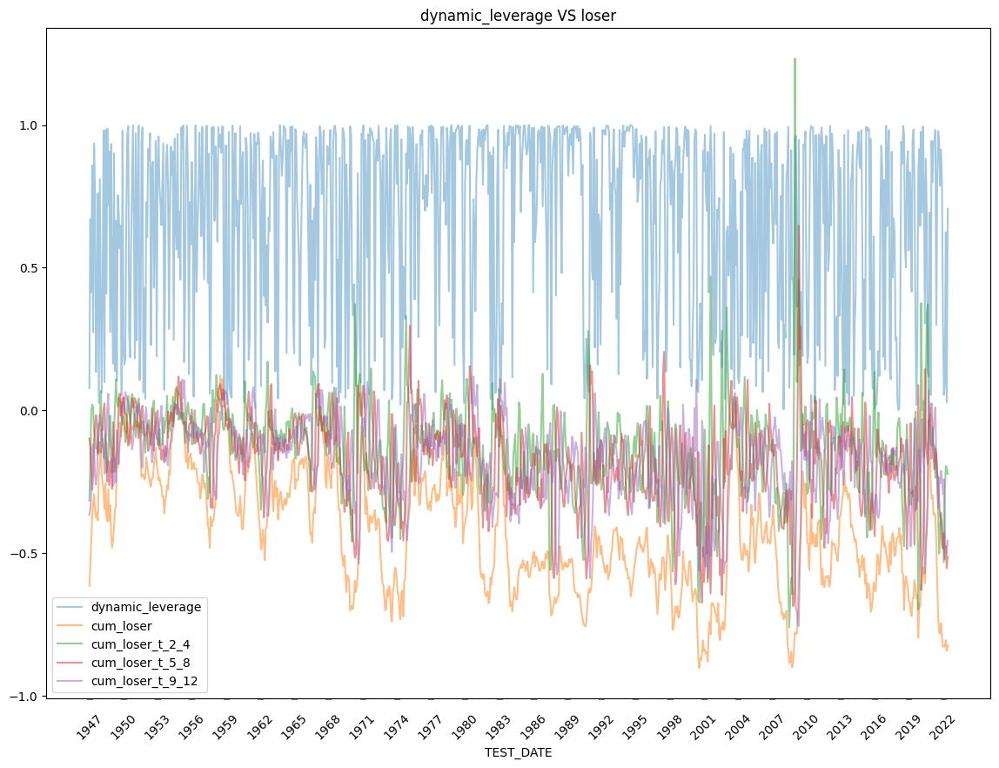

In [44]:
save_XGB = leverage_save(Fixed_XGB_Result, DATA)
save_XGB.to_csv(f'/content/drive/MyDrive/Fin_AI/save_data/csv/Tree/XGB_{case_name}.csv')


Feature Importance of the model



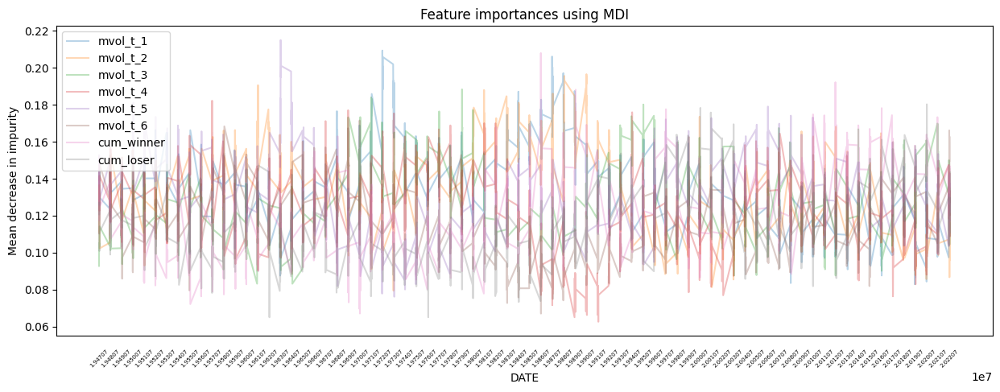

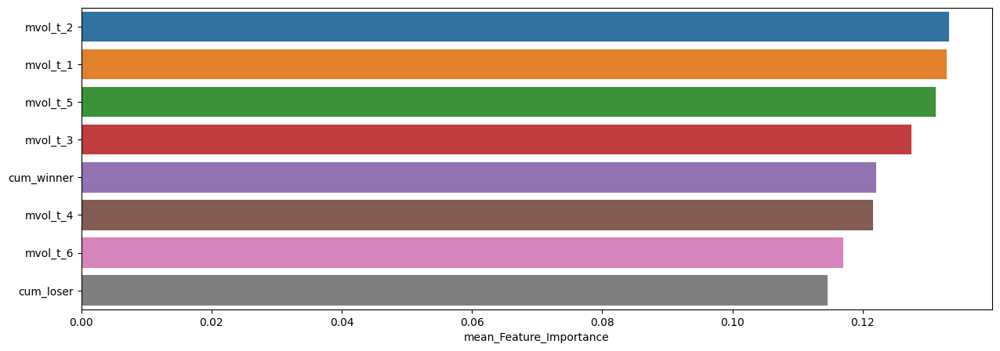

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_2,0.133226,0.196555,0.079363
mvol_t_1,0.132851,0.209362,0.082866
mvol_t_5,0.131185,0.215035,0.076093
mvol_t_3,0.127442,0.188348,0.083122
cum_winner,0.122110,0.207990,0.067011
mvol_t_4,0.121636,0.182223,0.062550
mvol_t_6,0.116978,0.171493,0.066977
cum_loser,0.114573,0.180265,0.064967


In [45]:
plot_feature_importances(Fixed_XGB_Result)


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.39      0.40        75
         1.0       0.71      0.73      0.72       151

    accuracy                           0.62       226
   macro avg       0.56      0.56      0.56       226
weighted avg       0.61      0.62      0.61       226


accuracy : 0.6150442477876106

precision : 0.7051282051282052

recall : 0.7284768211920529

F1-Score : 0.7166123778501629



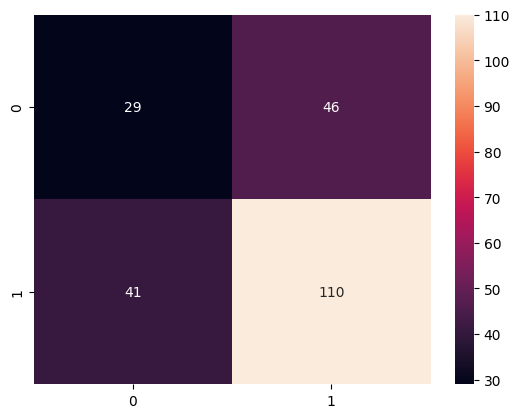


Feature Importance of the model



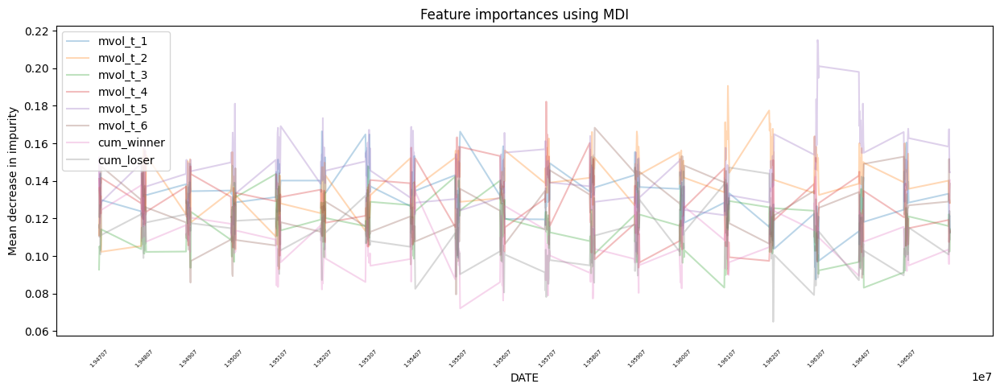

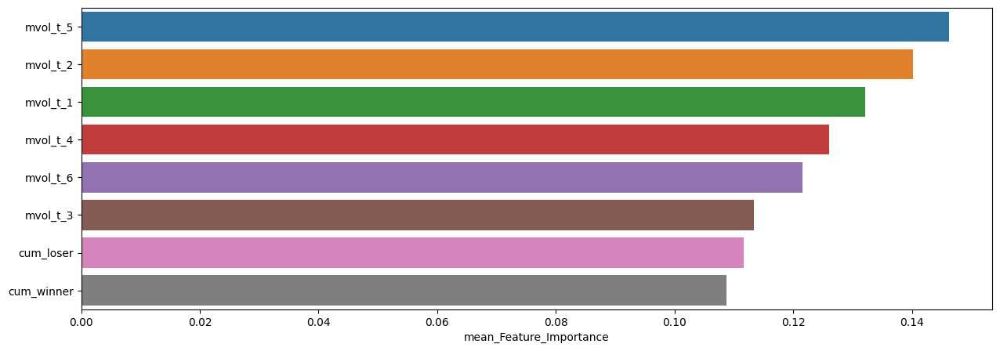

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,0.146233,0.215035,0.102182
mvol_t_2,0.140215,0.190620,0.092950
mvol_t_1,0.132118,0.166406,0.087543
mvol_t_4,0.126010,0.182223,0.090334
mvol_t_6,0.121541,0.168331,0.079524
mvol_t_3,0.113387,0.147725,0.083122
cum_loser,0.111676,0.147133,0.064967
cum_winner,0.108820,0.151934,0.072095



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.49      0.39      0.43        75
         1.0       0.72      0.80      0.76       151

    accuracy                           0.66       226
   macro avg       0.61      0.59      0.60       226
weighted avg       0.65      0.66      0.65       226


accuracy : 0.6637168141592921

precision : 0.7245508982035929

recall : 0.8013245033112583

F1-Score : 0.7610062893081762



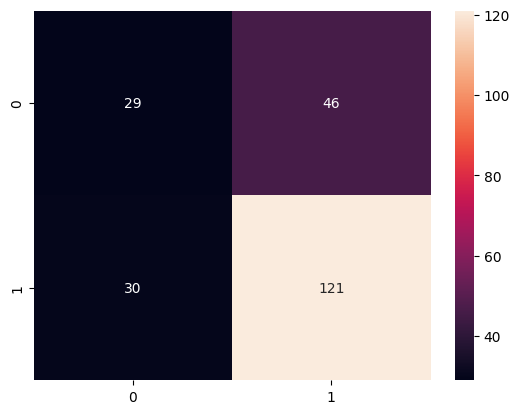


Feature Importance of the model



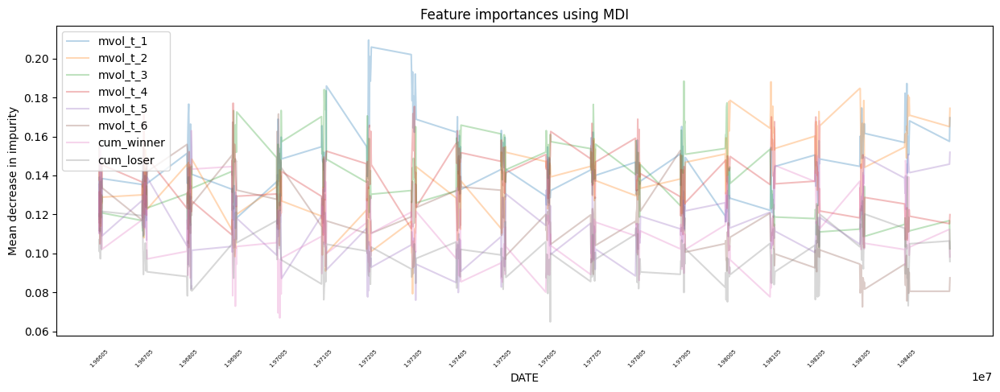

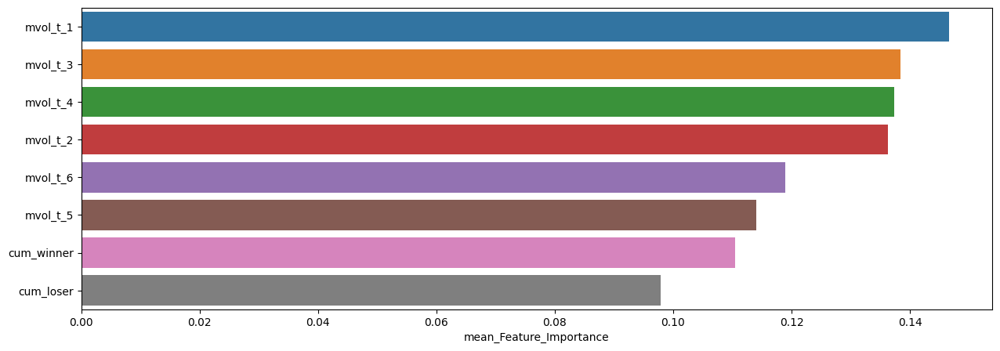

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.146572,0.209362,0.112376
mvol_t_3,0.138389,0.188348,0.102447
mvol_t_4,0.137334,0.177059,0.103037
mvol_t_2,0.136285,0.187991,0.079363
mvol_t_6,0.118962,0.171493,0.072689
mvol_t_5,0.114100,0.151881,0.076093
cum_winner,0.110445,0.167978,0.067011
cum_loser,0.097913,0.140402,0.064997



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.33      0.36        70
         1.0       0.72      0.77      0.74       156

    accuracy                           0.63       226
   macro avg       0.55      0.55      0.55       226
weighted avg       0.62      0.63      0.62       226


accuracy : 0.6327433628318584

precision : 0.718562874251497

recall : 0.7692307692307693

F1-Score : 0.7430340557275542



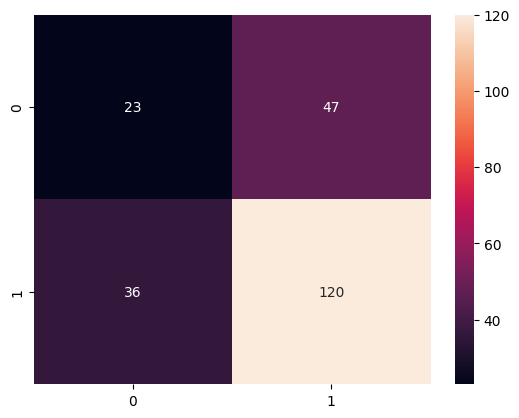


Feature Importance of the model



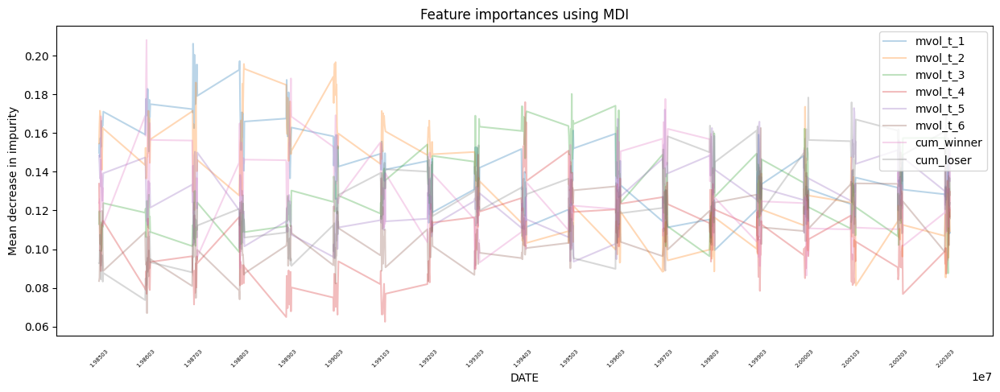

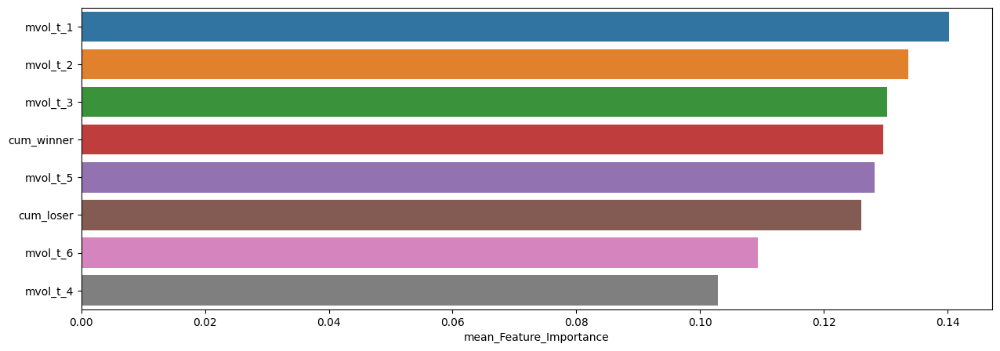

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,0.140184,0.206129,0.099523
mvol_t_2,0.133578,0.196555,0.081236
mvol_t_3,0.130207,0.180163,0.087547
cum_winner,0.129563,0.207990,0.086448
mvol_t_5,0.128229,0.172856,0.093569
cum_loser,0.126045,0.178331,0.073755
mvol_t_6,0.109357,0.162570,0.066977
mvol_t_4,0.102837,0.175941,0.062550



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.46      0.44      0.45        96
         1.0       0.61      0.63      0.62       132

    accuracy                           0.55       228
   macro avg       0.53      0.53      0.53       228
weighted avg       0.55      0.55      0.55       228


accuracy : 0.5482456140350878

precision : 0.6058394160583942

recall : 0.6287878787878788

F1-Score : 0.617100371747212



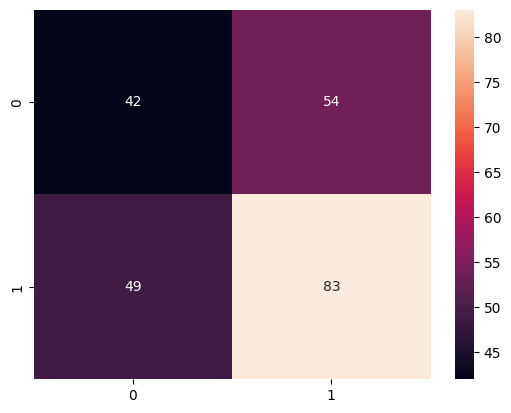


Feature Importance of the model



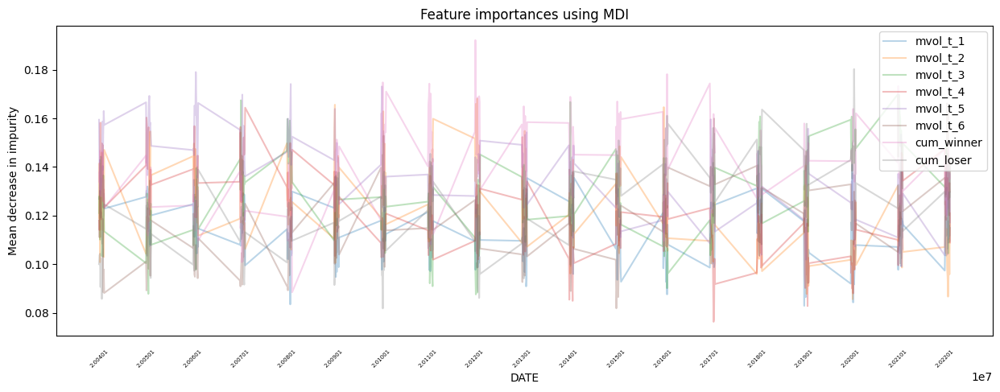

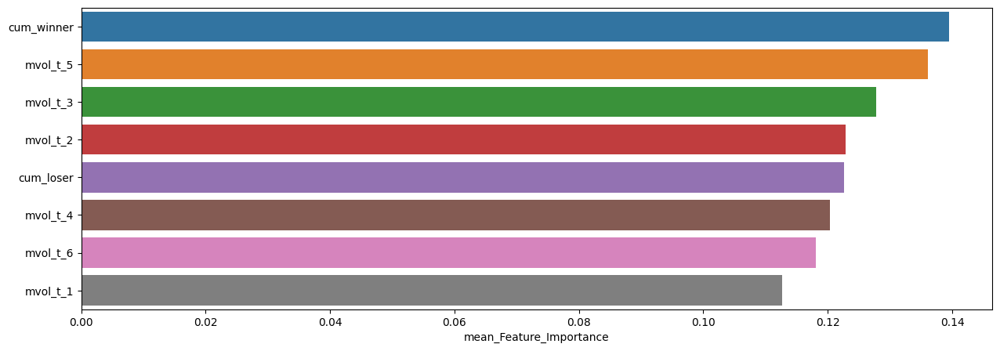

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner,0.139458,0.192193,0.088444
mvol_t_5,0.136135,0.179057,0.099050
mvol_t_3,0.127781,0.169846,0.087568
mvol_t_2,0.122916,0.168124,0.085601
cum_loser,0.122586,0.180265,0.081811
mvol_t_4,0.120375,0.164409,0.076289
mvol_t_6,0.118041,0.166143,0.081851
mvol_t_1,0.112708,0.146519,0.082866


In [46]:
slice_feature_importance(Fixed_XGB_Result, 4)

## LGBM

In [47]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

In [48]:
Fixed_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM) # 사용할 모델

**************************************************
설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]

ORG Sharpe Ratio : 0.7293406994683723
ML Sharpe Ratio : 0.8567977848348463


최근 누적 수익률

  2022년-12월 -> 31184.62
  2022년-11월 -> 30410.78
  2022년-10월 -> 30238.45
  2022년-09월 -> 27967.17
  2022년-08월 -> 27194.51

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 36048.83
  2등 : 2008년-11월 -> 34000.06
  3등 : 2009년-01월 -> 33634.65
  4등 : 2008년-12월 -> 33231.49
  5등 : 2008년-10월 -> 31409.89
  6등 : 2022년-12월 -> 31184.62
  7등 : 2022년-11월 -> 30410.78
  8등 : 2008년-09월 -> 30287.27
  9등 : 2022년-10월 -> 30238.45
  10등 : 2002년-09월 -> 29654.40



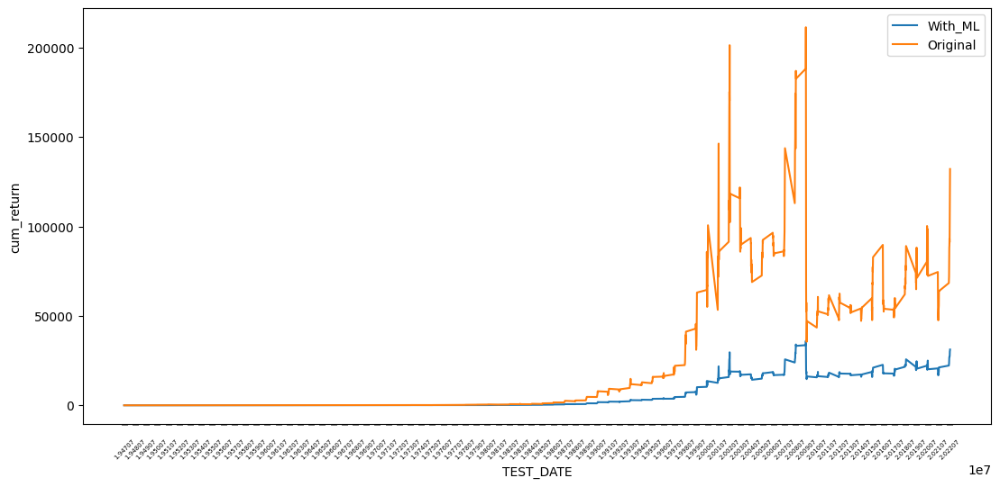

In [49]:
cum_return_sharpe_ratio(data=Fixed_LGBM_Result,
                        dynamic=True)


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.36      0.39       316
         1.0       0.68      0.74      0.71       590

    accuracy                           0.60       906
   macro avg       0.55      0.55      0.55       906
weighted avg       0.59      0.60      0.60       906


accuracy : 0.6048565121412803

precision : 0.6823899371069182

recall : 0.735593220338983

F1-Score : 0.7079934747145187



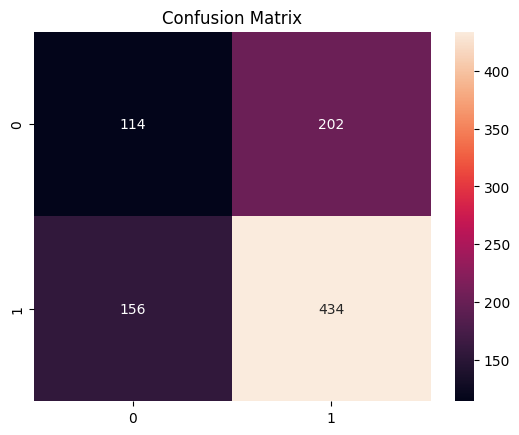


ACTUAL = PRED = 1



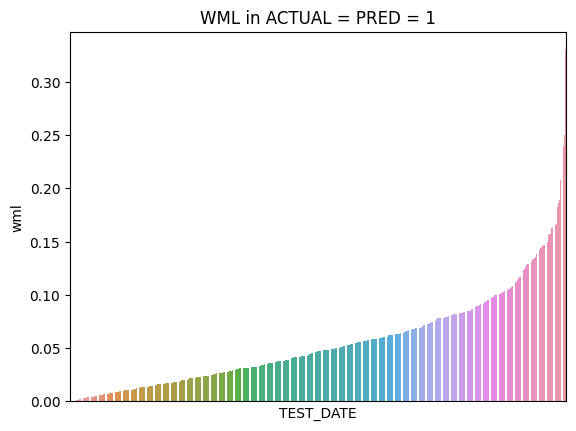

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,434.0,0.055572,0.002028,0.045037,0.000007,0.000765,0.022328,0.047104,0.078242,0.201381,0.330163


,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,434.0,0.045211,0.00146,0.038204,0.000006,0.000553,0.017127,0.036849,0.060405,0.168392,0.315492



--------------------------------------------------------------------------------


ACTUAL = PRED = 0



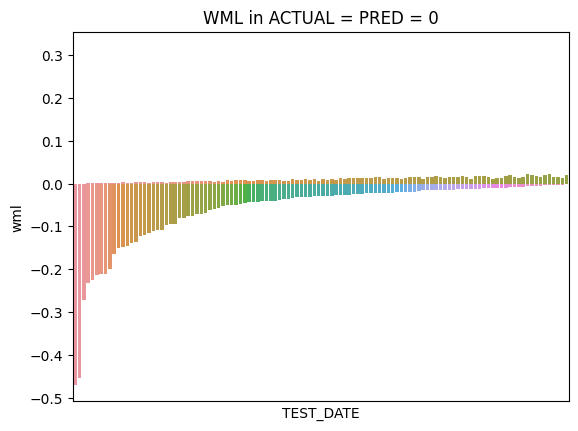

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,114.0,-0.059905,0.006312,0.079446,-0.469903,-0.43064,-0.07147,-0.0288,-0.014546,-0.002396,-0.000506


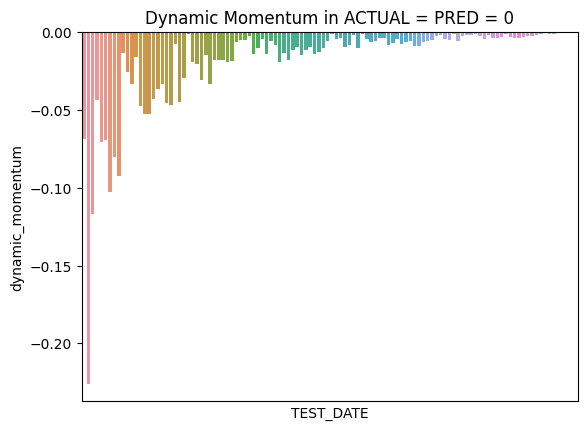

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,114.0,-0.018121,0.000882,0.029702,-0.225916,-0.115156,-0.018332,-0.007066,-0.003501,-0.000334,-0.000234



--------------------------------------------------------------------------------


ACTUAL = 0 & PRED = 1



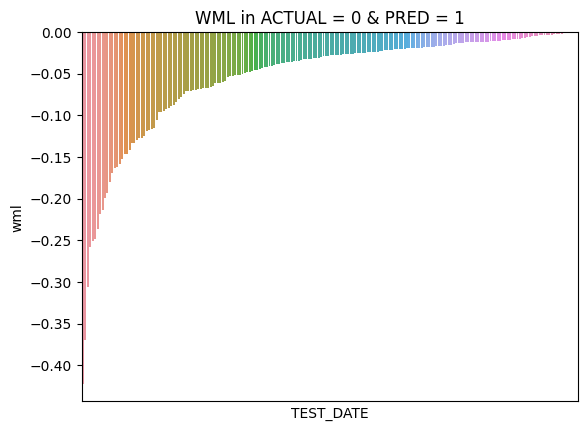

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,202.0,-0.054283,0.004393,0.066278,-0.4224,-0.305508,-0.067596,-0.028323,-0.01515,-0.000959,-0.000132


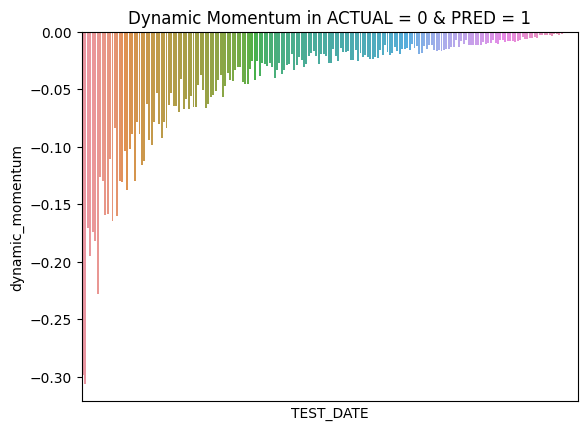

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,202.0,-0.041636,0.002523,0.050228,-0.306376,-0.227476,-0.052945,-0.021841,-0.011793,-0.000854,-0.000073



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



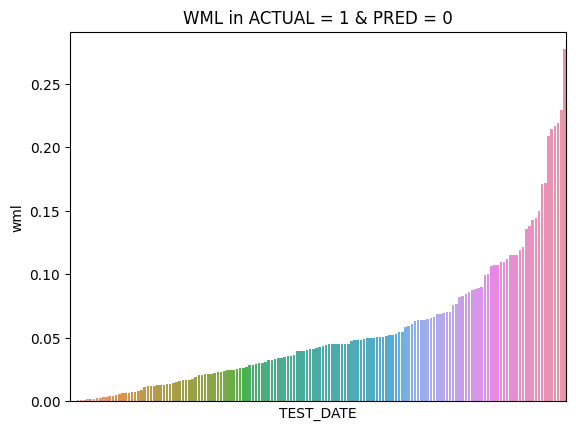

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,156.0,0.054353,0.00266,0.051572,0.000627,0.000754,0.018846,0.042232,0.069219,0.223565,0.276912


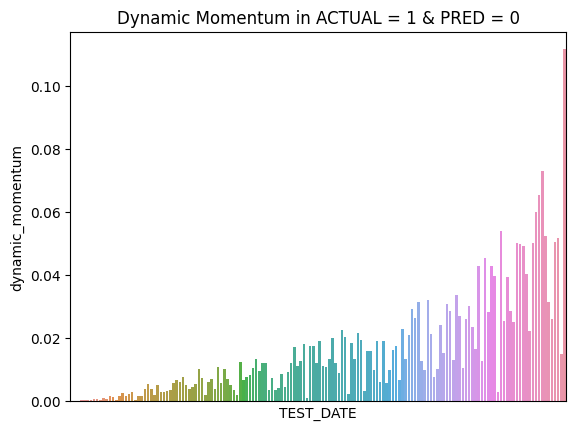

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,156.0,0.0161,0.000291,0.01706,0.000062,0.000245,0.003971,0.010712,0.02188,0.068969,0.111665


In [50]:
plot_predict_result(Fixed_LGBM_Result)


Top 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_t_1,mvol_t_2,mvol_t_3,mvol_t_4,mvol_t_5,mvol_t_6,cum_winner,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,,,,
20000229,19800229,20000131,0.330163,0.315492,1.0,0.955564,1.0,136,73,115,96,114,139,89,111,13605.519414
20020228,19820226,20020131,0.250175,0.234878,1.0,0.938854,1.0,129,89,123,88,103,129,91,120,19505.613337
19991231,19791231,19991130,0.239571,0.223152,1.0,0.931464,1.0,148,98,89,109,94,130,107,96,10131.595048
19980630,19780630,19980529,0.189223,0.185475,1.0,0.980191,1.0,145,99,104,85,130,112,89,107,6233.707498
19801128,19601130,19801031,0.186602,0.174082,1.0,0.932905,1.0,118,104,133,93,115,121,79,105,131.973455



Bottom 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_t_1,mvol_t_2,mvol_t_3,mvol_t_4,mvol_t_5,mvol_t_6,cum_winner,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,,,,
20021129,19821130,20021031,-0.370041,-0.306376,0.0,0.827953,1.0,145,96,110,95,103,151,79,109,17316.288380
20090331,19890331,20090227,-0.422400,-0.298716,0.0,0.707187,1.0,115,101,113,74,151,99,94,92,25280.168199
19740131,19540129,19731231,-0.237095,-0.227805,0.0,0.960818,1.0,133,105,124,109,101,107,98,90,30.286377
20090430,19890428,20090331,-0.454349,-0.225916,0.0,0.497229,0.0,111,102,97,67,154,119,108,92,19568.755266
20011130,19811130,20011031,-0.257774,-0.194915,0.0,0.756146,1.0,150,99,103,105,107,112,113,105,14481.032757


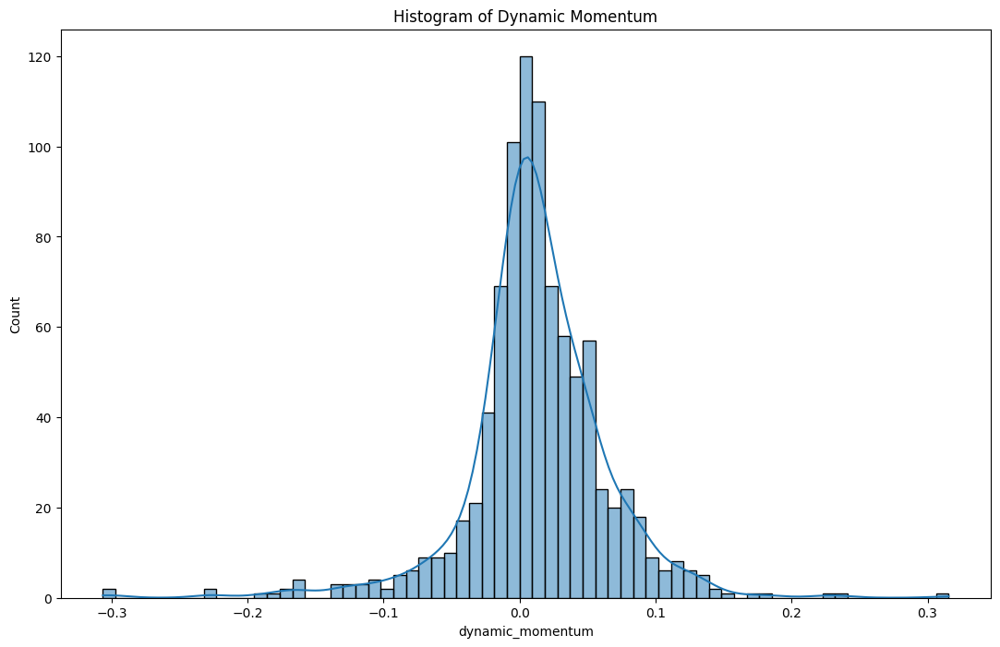

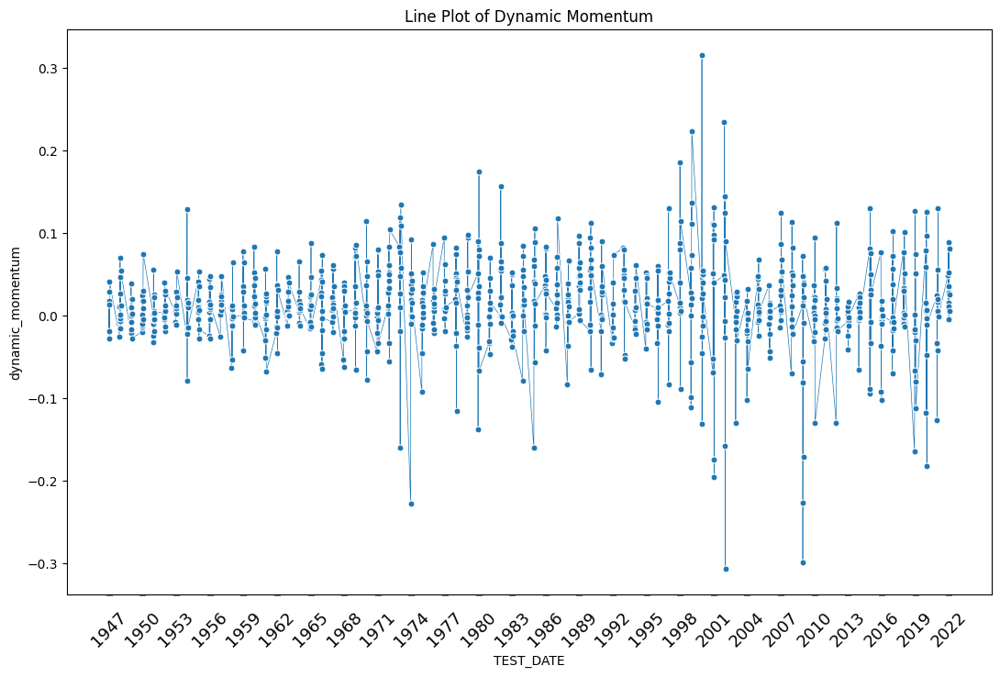

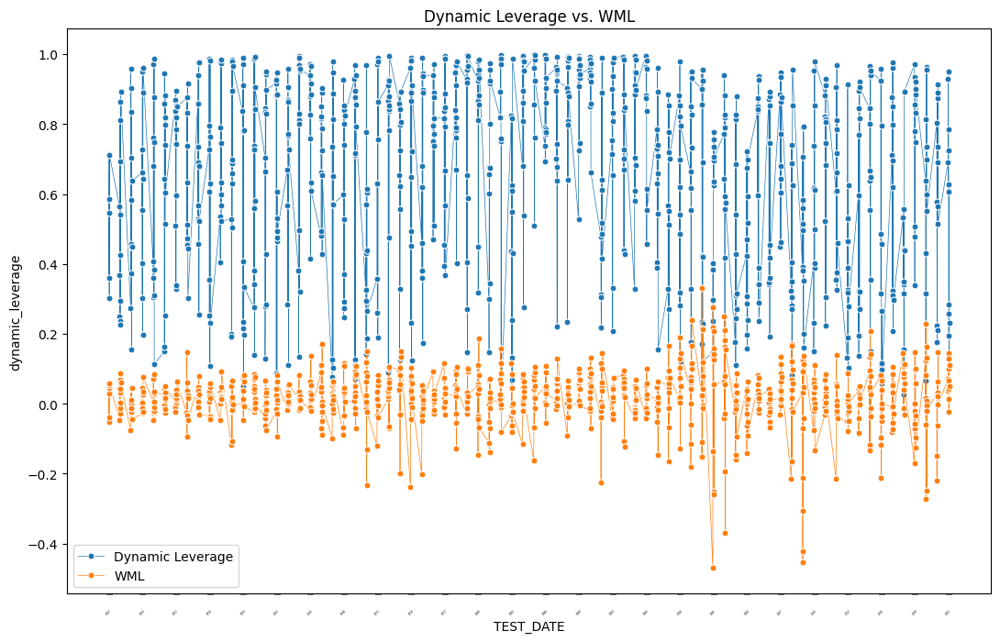

In [51]:
plot_dynamic_momentum(Fixed_LGBM_Result)

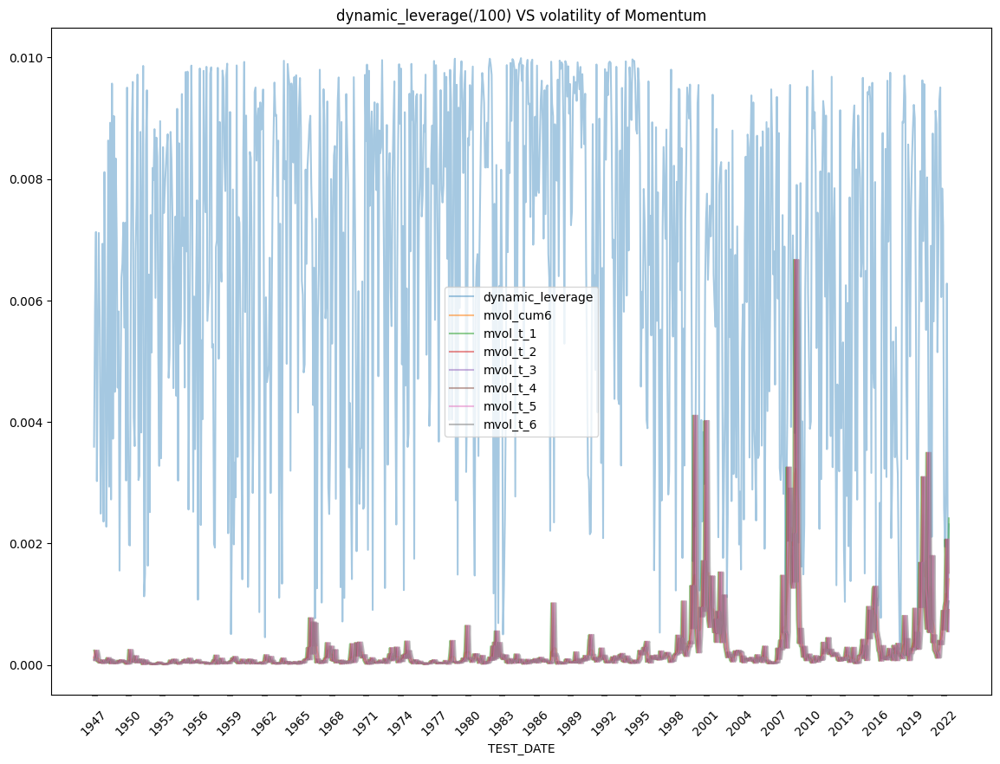

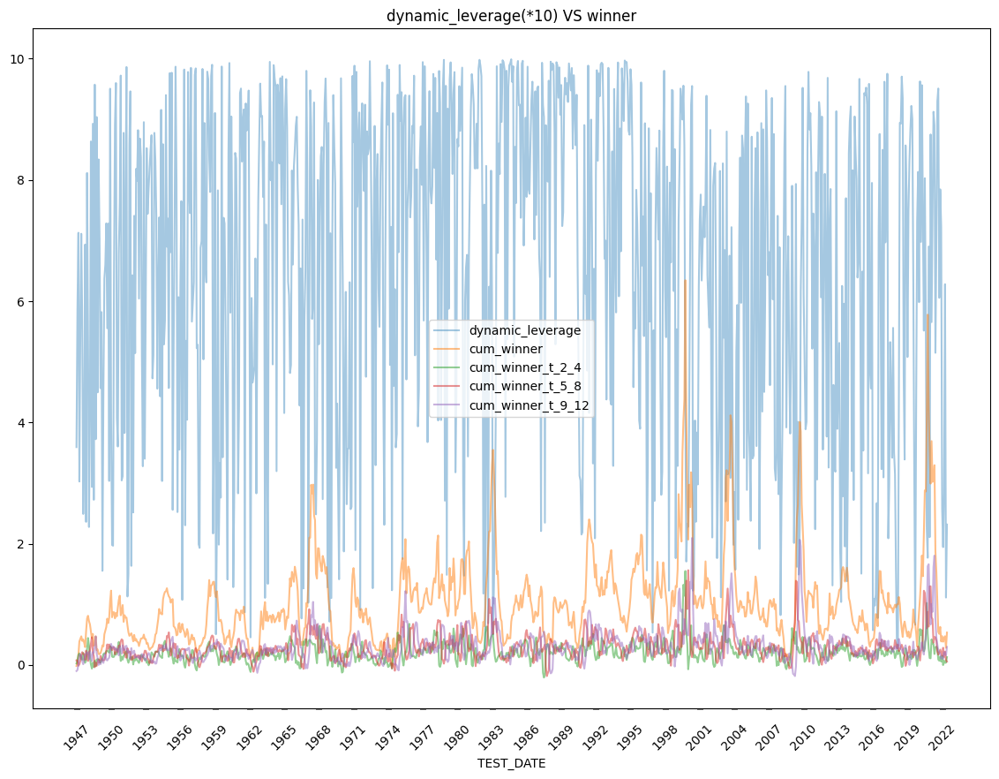

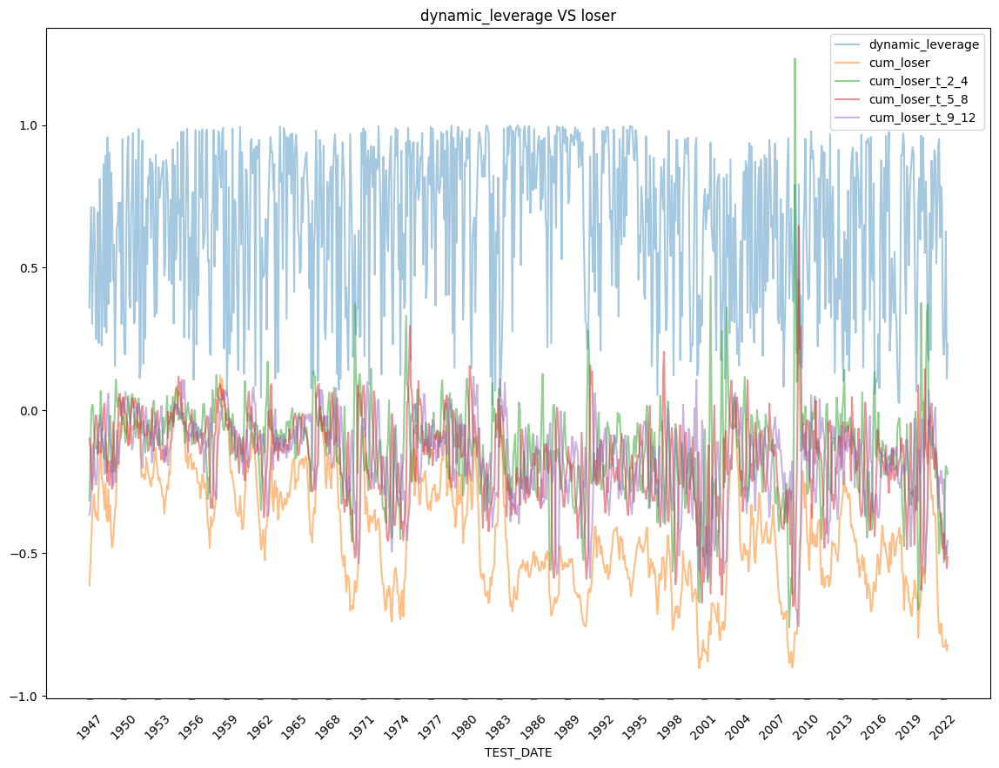

In [52]:
save_LGBM = leverage_save(Fixed_LGBM_Result, DATA)
save_LGBM.to_csv(f'/content/drive/MyDrive/Fin_AI/save_data/csv/Tree/LGBM_{case_name}.csv')


Feature Importance of the model



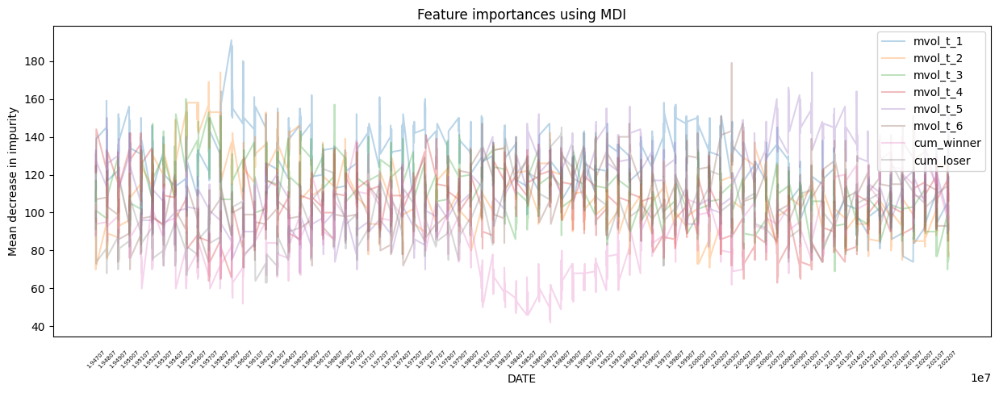

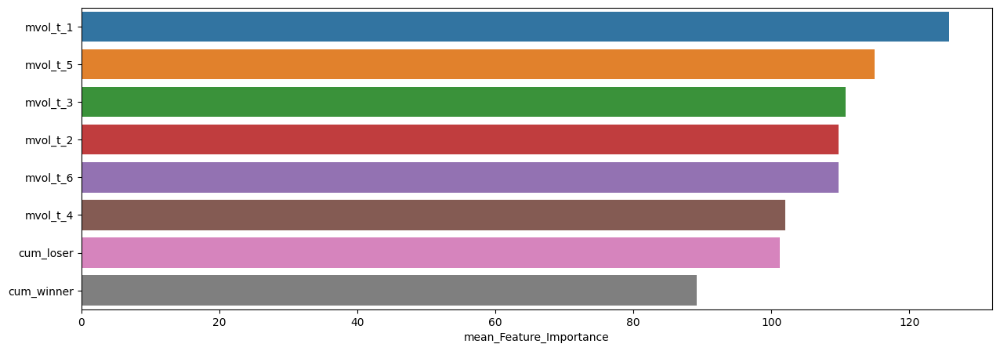

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,125.709713,191,74
mvol_t_5,114.902870,174,68
mvol_t_3,110.704194,160,69
mvol_t_2,109.778146,174,70
mvol_t_6,109.716336,179,70
mvol_t_4,102.044150,144,63
cum_loser,101.213024,145,63
cum_winner,89.179912,141,42


In [53]:
plot_feature_importances(Fixed_LGBM_Result)


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.33      0.34        75
         1.0       0.68      0.70      0.69       151

    accuracy                           0.58       226
   macro avg       0.52      0.52      0.52       226
weighted avg       0.57      0.58      0.58       226


accuracy : 0.5796460176991151

precision : 0.6794871794871795

recall : 0.7019867549668874

F1-Score : 0.6905537459283388



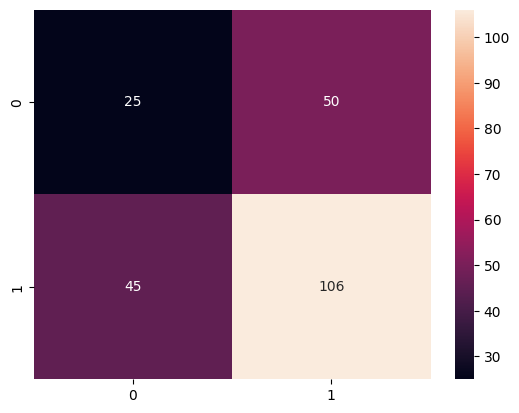


Feature Importance of the model



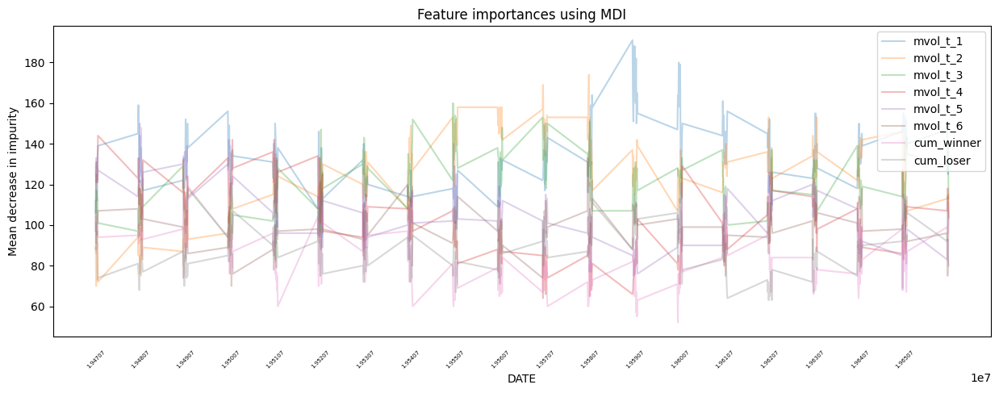

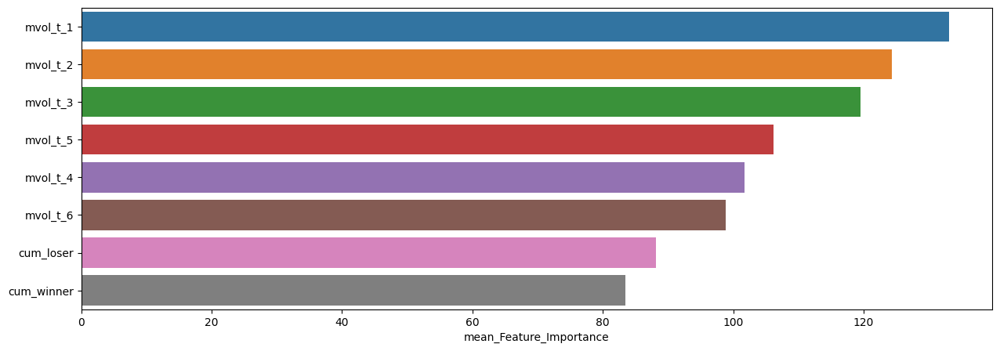

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,133.079646,191,89
mvol_t_2,124.323009,174,70
mvol_t_3,119.544248,160,83
mvol_t_5,106.225664,150,68
mvol_t_4,101.774336,144,64
mvol_t_6,98.814159,133,70
cum_loser,88.132743,122,63
cum_winner,83.495575,120,52



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.46      0.35      0.39        75
         1.0       0.71      0.79      0.75       151

    accuracy                           0.65       226
   macro avg       0.58      0.57      0.57       226
weighted avg       0.63      0.65      0.63       226


accuracy : 0.6460176991150443

precision : 0.7100591715976331

recall : 0.7947019867549668

F1-Score : 0.7499999999999999



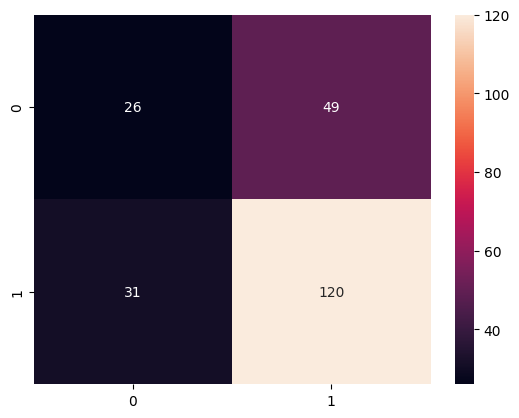


Feature Importance of the model



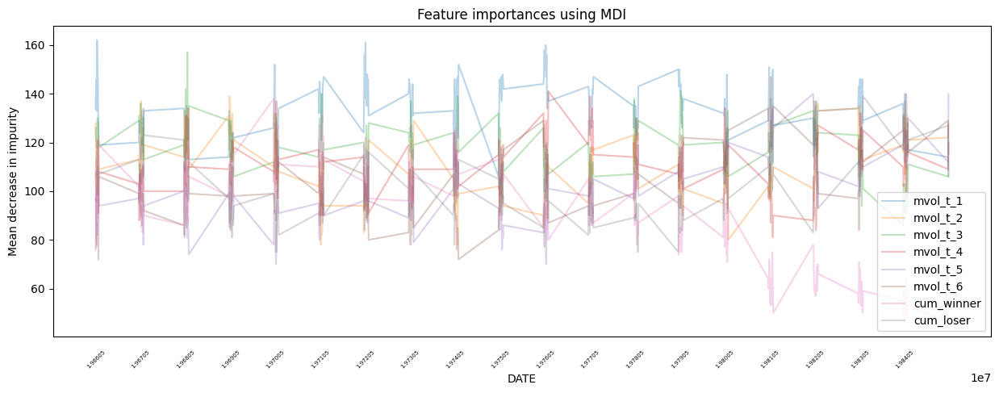

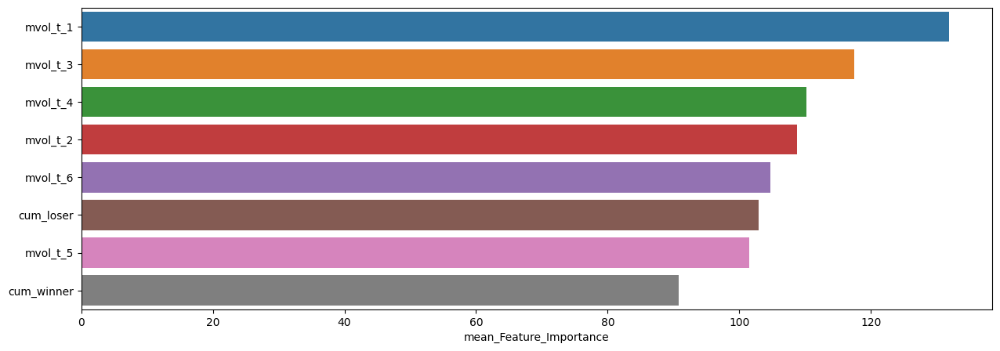

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,131.836283,162,105
mvol_t_3,117.477876,157,86
mvol_t_4,110.230088,141,81
mvol_t_2,108.725664,139,78
mvol_t_6,104.690265,147,72
cum_loser,102.915929,139,75
mvol_t_5,101.451327,140,70
cum_winner,90.840708,138,46



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.29      0.34        70
         1.0       0.72      0.82      0.77       156

    accuracy                           0.65       226
   macro avg       0.57      0.55      0.55       226
weighted avg       0.63      0.65      0.63       226


accuracy : 0.6548672566371682

precision : 0.7191011235955056

recall : 0.8205128205128205

F1-Score : 0.7664670658682635



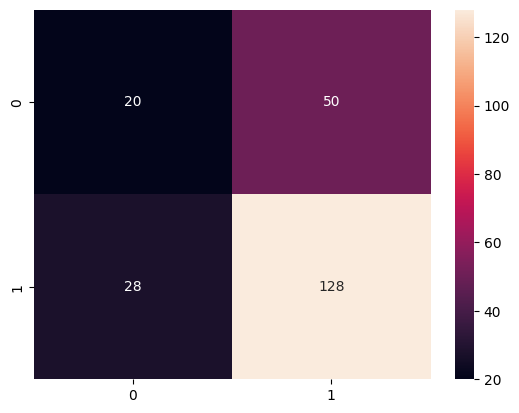


Feature Importance of the model



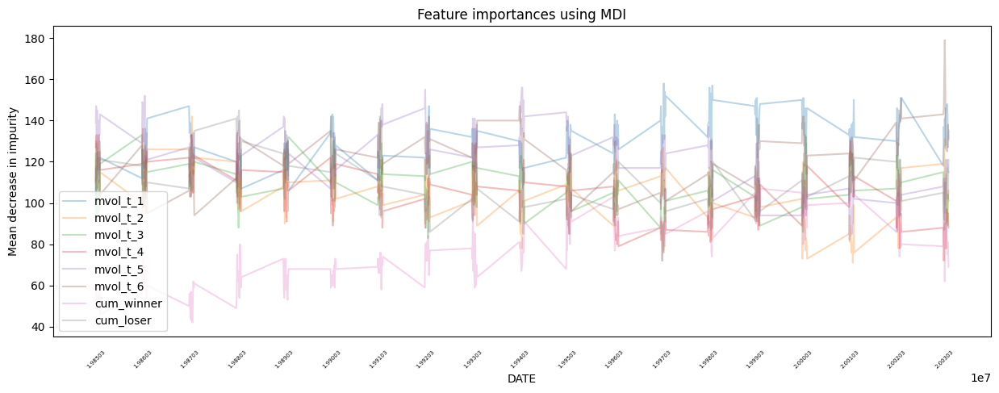

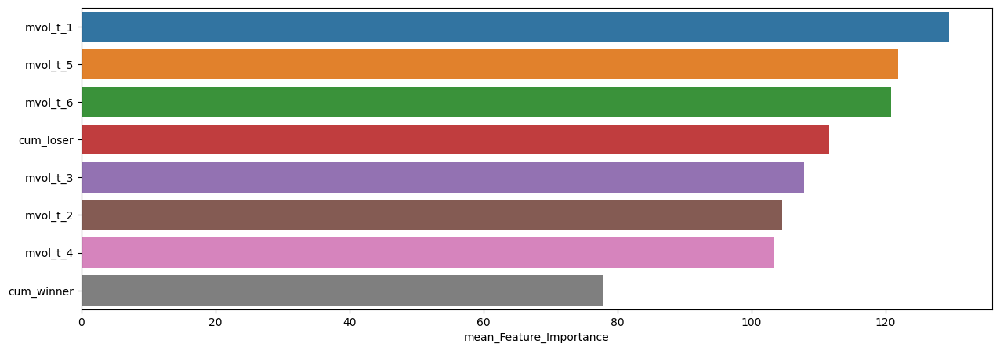

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_1,129.455752,158,99
mvol_t_5,121.889381,156,82
mvol_t_6,120.871681,179,93
cum_loser,111.579646,145,85
mvol_t_3,107.823009,142,72
mvol_t_2,104.548673,142,71
mvol_t_4,103.349558,136,72
cum_winner,77.964602,113,42



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.45      0.45      0.45        96
         1.0       0.60      0.61      0.60       132

    accuracy                           0.54       228
   macro avg       0.53      0.53      0.53       228
weighted avg       0.54      0.54      0.54       228


accuracy : 0.5394736842105263

precision : 0.6015037593984962

recall : 0.6060606060606061

F1-Score : 0.6037735849056604



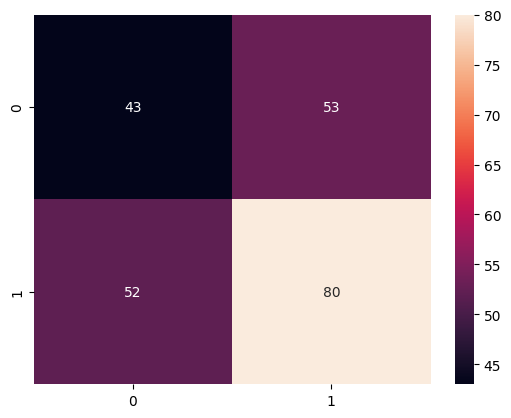


Feature Importance of the model



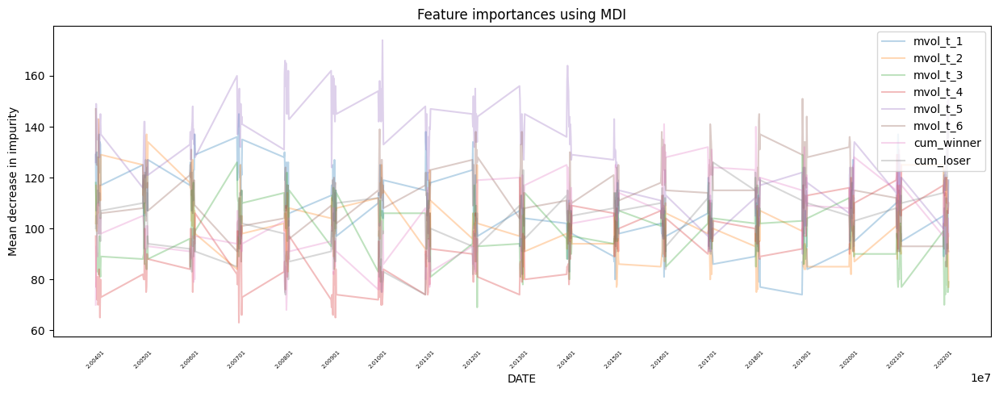

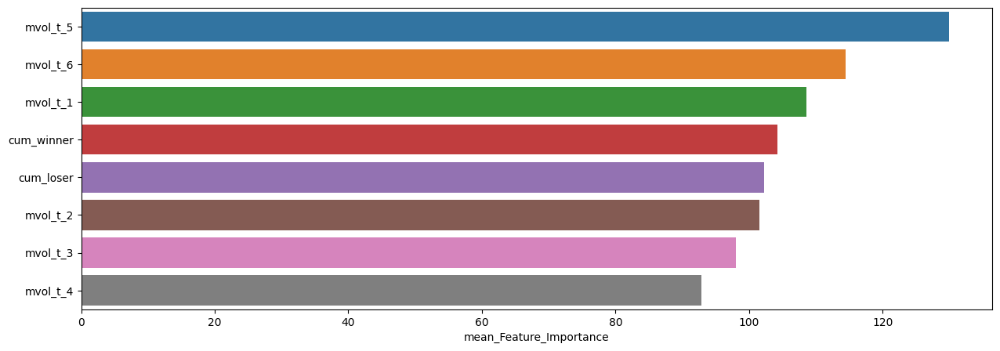

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_t_5,129.912281,174,90
mvol_t_6,114.447368,151,85
mvol_t_1,108.618421,145,74
cum_winner,104.285088,141,68
cum_loser,102.214912,141,74
mvol_t_2,101.587719,143,75
mvol_t_3,98.083333,129,69
mvol_t_4,92.903509,129,63


In [54]:
slice_feature_importance(Fixed_LGBM_Result, 4)

# Compare

## F1 Score

RDF의 F1-Score : 0.7376543209876543
GBC의 F1-Score : 0.7126984126984127
XGB의 F1-Score : 0.7132292522596548
LGBM의 F1-Score : 0.7079934747145187



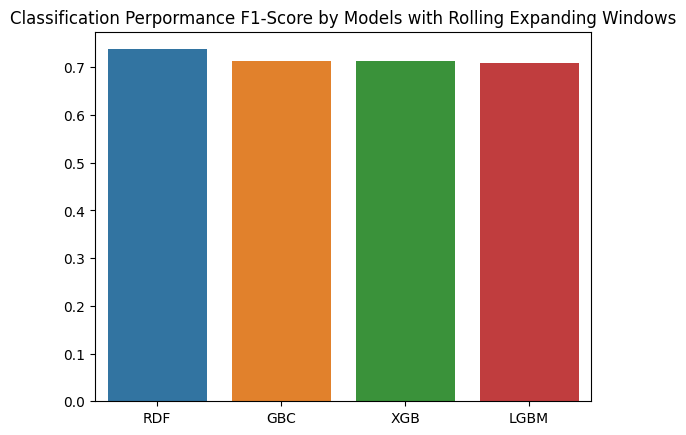

In [55]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'static_leverage'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance F1-Score by Models with Rolling Expanding Windows')
plt.show()

## Cum Return & Sharpe Ratio

In [56]:
def compare_sharpe_ratio(list_model, list_result):

    for model, data in zip(list_model, list_result):

      S = (data['dynamic_momentum'].mean()/data['dynamic_momentum'].std())*math.sqrt(12)
      C = list(data['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))

      sns.lineplot(data=data, x=data.index, y='cum_return', alpha=0.7, label=model)

    CUM_WML = data[['wml']]
    CUM_WML['cum_return'] = (1 + CUM_WML.wml).cumprod() - 1

    org_S = (CUM_WML['wml'].mean()/CUM_WML['wml'].std())*math.sqrt(12)
    org_C = list(CUM_WML['cum_return'])[-1]
    print()
    print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format('ORG', org_S, org_C))
    print()

    sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')
    plt.title('Sharpe Ratio & Cum Return by Model')
    plt.xticks([CUM_WML.index[i] for i in range(0, len(CUM_WML.index), 36)],
              labels=[str(CUM_WML.index[i])[:4] for i in range(0, len(CUM_WML.index), 36)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=10,
                      width=0.1)
    plt.show()

RDF Sharpe Ratio : 0.7986  최종 누적 수익률 : 8850.608604045156
GBC Sharpe Ratio : 0.7759  최종 누적 수익률 : 9707.015885120429
XGB Sharpe Ratio : 0.8455  최종 누적 수익률 : 41680.72849486821
LGBM Sharpe Ratio : 0.8568  최종 누적 수익률 : 31184.61945794011

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353



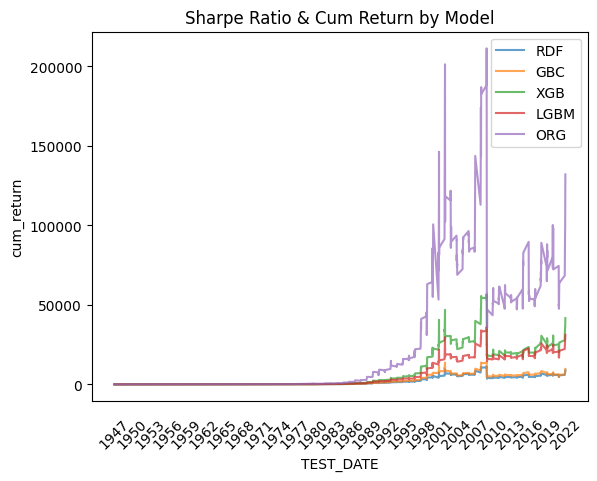

In [59]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result])